# Wine Project - The End
Éste es el último proyecto de XTOL. No es más que un hasta luego, no es más que un simple adios, muy pronto volveré, con Python y más datos...

## El problema
Vinos de Costa Rica es una empresa dedicada a la producción de vinos tintos y blancos para la venta en el exterior. Preocupados por la calidad de su producto, recientemente hizo una cata de diversas botellas para obtener retroalimentación de los comensales. Estos calificaron de 0 a 10 cada muestra de vino. 

A cada muestra catada se le había realizado un análisis físico-químico previo. Por tanto, tenemos para cada muestra los valores de los resultados sensoriales de la cata asociados a los valores físicos y químicos.

Vinos de Costa Rica quiere saber lo siguiente:
- ¿Es posible encontrar relación entre las características física-químicas del vino y las mejores calificaciones dadas al vino?
- ¿Cuáles son las características física-químicas más importantes?
- ¿Hay diferencias entre el vino tinto y blanco a la hora de relacionar las características físicas-químicas con la evaluación sensorial?
- ¿Es posible predecir la evaluación sensorial que darán los comensales al vino si de antemano se conocen las características físicas-químicas? Esta información podría dirigir estrategias de marketing, precio y colocación de productos en mercados específicos.

## Entendiendo el vino

La cata de vinos se basa en 5 elementos
1. La dulzura
2. La acidez
3. Los taninos (El tanino en el vino es la presencia de compuestos fenólicos que agregan amargor a un vino)
4. El alchol
5. El cuerpo (El cuerpo es una instantánea de la impresión general de un vino)




## Importar librerías requeridas

In [703]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FormatStrFormatter
import seaborn as sns
from sklearn import preprocessing
from scipy import stats

from sklearn.model_selection import cross_val_score

#cross validation 
from sklearn.model_selection import train_test_split

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from sklearn.metrics import accuracy_score, log_loss, cohen_kappa_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV



## Análisis inicial de los datos

### Carga de datos crudos

In [153]:
dsRedRaw = pd.io.parsers.read_csv("winequality-red.csv", sep=";")
dsWhiteRaw = pd.io.parsers.read_csv("winequality-white.csv", sep=";")

### ¿qué nos dicen los datos crudos?

In [154]:
dsRedRaw.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [155]:
dsWhiteRaw.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


Ambos datasets tienen las mismas columnas. IDEA: unir en un solo dataset con una variable que distinta a los blancos de los tintos

In [156]:
dsRedRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
fixed acidity           1599 non-null float64
volatile acidity        1599 non-null float64
citric acid             1599 non-null float64
residual sugar          1599 non-null float64
chlorides               1599 non-null float64
free sulfur dioxide     1599 non-null float64
total sulfur dioxide    1599 non-null float64
density                 1599 non-null float64
pH                      1599 non-null float64
sulphates               1599 non-null float64
alcohol                 1599 non-null float64
quality                 1599 non-null int64
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [157]:
dsWhiteRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
fixed acidity           4898 non-null float64
volatile acidity        4898 non-null float64
citric acid             4898 non-null float64
residual sugar          4898 non-null float64
chlorides               4898 non-null float64
free sulfur dioxide     4898 non-null float64
total sulfur dioxide    4898 non-null float64
density                 4898 non-null float64
pH                      4898 non-null float64
sulphates               4898 non-null float64
alcohol                 4898 non-null float64
quality                 4898 non-null int64
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Hay 3 veces más samples de vino blanco que vino tinto (4898 vs 1599)

In [158]:
dsRedRaw.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [159]:
dsWhiteRaw.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


Interesante: en los vinos blancos la presencia de residual sugar, sulfur dioxide es más alta que en los tintos. En caso contrario, fixed acidity tiene a ser un poco más alta en tintos que en blanco. El promedio de quality es similar en ambos casos.

Para tener un único dataset se procederá a unificar ambos.

In [160]:
dsRedRaw["type"] = "R"
dsWhiteRaw["type"] = "W"
dsRaw = pd.concat([dsRedRaw, dsWhiteRaw],ignore_index=True)
dsRaw["type"] = dsRaw["type"].astype("category")
dsRaw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
fixed acidity           6497 non-null float64
volatile acidity        6497 non-null float64
citric acid             6497 non-null float64
residual sugar          6497 non-null float64
chlorides               6497 non-null float64
free sulfur dioxide     6497 non-null float64
total sulfur dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6497 non-null float64
sulphates               6497 non-null float64
alcohol                 6497 non-null float64
quality                 6497 non-null int64
type                    6497 non-null category
dtypes: category(1), float64(11), int64(1)
memory usage: 615.7 KB


In [161]:
dsRaw.shape

(6497, 13)

In [162]:
dsRaw.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,R
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,R
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,R
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,R
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,R


In [163]:
dsRaw.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,W
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,W
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,W
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,W
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6,W


In [164]:
dsRaw.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


### Hora de limpiar los datos

Algunas observaciones iniciales:

La variable dependiente quality podría ser numérica o factor. Si se convierte a factor entonces se deben utilizar algoritmos de clasificación. Si se deja numérica se deben utilizar algoritmos de regresión. Como en este punto no tengo claro como proceder, se creará una segunda variable dependiente llamada qualityf equivalente a quality pero factor.

La variable type, que indica si es tinto (R) o blanco (W) es candidata a dummify.

La mayoría de las variables podrán ser escaladas. En el análisis preliminar esta tarea no se realizará para dejar al EDA información en escala normal para observar tendencias y correlaciones.

In [165]:
# se crea una nueva variable para dejar los datos crudos tal cual.
dsWine01 = dsRaw.copy()

#### Reordenar columnas
Para que el tipo quede primero

In [166]:
#cols = dsWine01.columns.tolist()
#cols = cols[-1:] + cols[:-1]
#dsWine01 = dsWine01[cols].copy()
#dsWine01.head()

### Nueva columna qualityf

In [167]:
dsWine01["qualityf"] = dsWine01["quality"].astype("category")
dsWine01.info()
print(dsWine01.qualityf.unique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 14 columns):
fixed acidity           6497 non-null float64
volatile acidity        6497 non-null float64
citric acid             6497 non-null float64
residual sugar          6497 non-null float64
chlorides               6497 non-null float64
free sulfur dioxide     6497 non-null float64
total sulfur dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6497 non-null float64
sulphates               6497 non-null float64
alcohol                 6497 non-null float64
quality                 6497 non-null int64
type                    6497 non-null category
qualityf                6497 non-null category
dtypes: category(2), float64(11), int64(1)
memory usage: 622.4 KB
[5, 6, 7, 4, 8, 3, 9]
Categories (7, int64): [5, 6, 7, 4, 8, 3, 9]


##### Interesante
Los valores de quality no están de 1 a 10. Están de 3 a 9. Esto podría estar a favor de un algortimo de clasificación

### Dumify simple

In [168]:
dsWine01['type_red'] = dsWine01['type'].apply(lambda x: 1 if x == 'R' else 0)
dsWine01['type_white'] = dsWine01['type'].apply(lambda x: 1 if x == 'W' else 0)
dsWine01['type_red']=dsWine01['type_red'].astype("int32")
dsWine01['type_white']=dsWine01['type_white'].astype("int32")
dsWine01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 16 columns):
fixed acidity           6497 non-null float64
volatile acidity        6497 non-null float64
citric acid             6497 non-null float64
residual sugar          6497 non-null float64
chlorides               6497 non-null float64
free sulfur dioxide     6497 non-null float64
total sulfur dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6497 non-null float64
sulphates               6497 non-null float64
alcohol                 6497 non-null float64
quality                 6497 non-null int64
type                    6497 non-null category
qualityf                6497 non-null category
type_red                6497 non-null int32
type_white              6497 non-null int32
dtypes: category(2), float64(11), int32(2), int64(1)
memory usage: 673.1 KB


In [169]:
dsWine01.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.246114,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,0.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,0.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,0.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000,1.000000


### Revisión NA

In [170]:
dsWine01.isnull().values.any()

False

## Análisis Visual de los Datos

In [177]:
print(dsWine01.dtypes.index)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type', 'qualityf', 'type_red',
       'type_white'],
      dtype='object')


### Vino tinto vs blanco

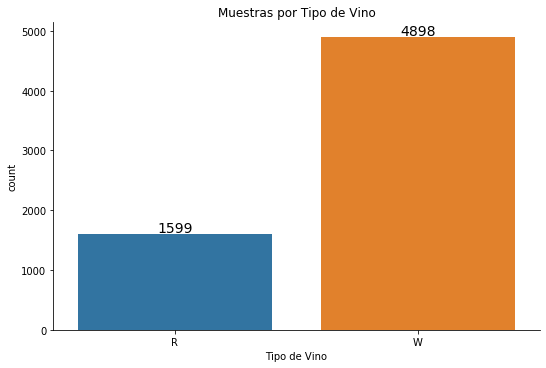

In [171]:
fg = sns.catplot('type', data=dsWine01, kind='count', aspect=1.5)
fg.set_xlabels('Tipo de Vino')
fg.ax.set_title('Muestras por Tipo de Vino')
for i, bar in enumerate(fg.ax.patches):
    h = bar.get_height()
    fg.ax.text(
        i, # bar index (x coordinate of text)
        h+100, # y coordinate of text
        '{}'.format(int(h)),  # y label
        ha='center', 
        va='center', 
        size=14)

Las muestras de vino blanco representa el 75% de las muestras. El vino tinto representa el 25%

### Puntaje de Calidad según el tipo de vino

Text(0.5, 1, 'Muestras por puntaje de Quality según tipo de vino')

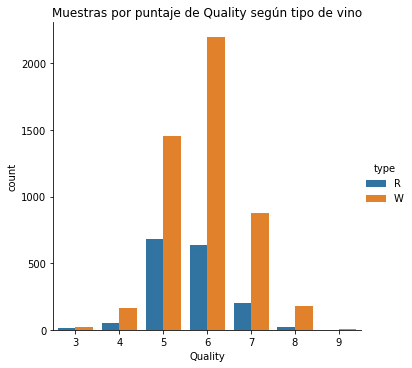

In [172]:
fg2 = sns.factorplot('qualityf', data=dsWine01, hue='type', kind='count')
fg2.set_xlabels('Quality')
fg2.ax.set_title('Muestras por puntaje de Quality según tipo de vino')


In [176]:
pd.pivot_table(dsWine01, values=['type_red','type_white'], index=['qualityf'], aggfunc=np.sum, fill_value=0)

,type_red,type_white
qualityf,,
3,10,20
4,53,163
5,681,1457
6,638,2198
7,199,880
8,18,175
9,0,5


Los vinos tintos tienen calificación mayoritariamente de 5 y 6, 5 más que 6. Igual sucede con los blancos, pero mucho más 6  que 5. Nótese que tintos no tienen calificación 9.

### Histogramas y Linear plots

In [476]:
def myHistFeature(feature):
    x1 = dsWine01[feature]
    x2 = dsWine01[dsWine01.type == 'R'][feature]
    x3 = dsWine01[dsWine01.type == 'W'][feature]
    fig, axs = plt.subplots(1, 3, sharey=False, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_xlabel(feature)
        
    nx2 = feature + ' reds'
    nx3 = feature + ' whites'
    axs[0].set_title('Histograma ' + feature +' Reds & Whites')
    axs[0].hist(x1)
    axs[1].set_title('Histograma ' + nx2)
    axs[1].hist(x2)
    axs[2].set_title('Histograma ' + nx3)
    axs[2].hist(x3)
    print(pd.concat([x1,x2.rename(nx2),x3.rename(nx3)],axis=1).describe())
    
def myLinearFeature(feature):
    x1 = dsWine01[feature]
    x2 = dsWine01[dsWine01.type == 'R'][feature]
    x3 = dsWine01[dsWine01.type == 'W'][feature]
    fig, axs = plt.subplots(1, 3, sharey=False, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_ylabel(feature)
        axs[i].set_xlabel('samples')

    nx2 = feature + ' reds'
    nx3 = feature + ' whites'
    axs[0].set_title('Linear ' + feature +' Reds & Whites')
    axs[0].plot(x1)
    axs[1].set_title('Linear ' + nx2)
    axs[1].plot(x2)
    axs[2].set_title('Linear ' + nx3)
    axs[2].plot(x3)
    plt.show()
    
def myLinearFeatureComp(title1, ds1, feature1, title2, ds2, feature2, title3, ds3, feature3):
    x1 = ds1[feature1]
    x2 = ds2[feature2]
    x3 = ds3[feature3]
    
    fig, axs = plt.subplots(1, 3, sharey=False, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_ylabel(feature1)        
        axs[i].set_xlabel('samples')

    nx1 = title1 + '\n' + feature1 
    nx2 = title2 + '\n' + feature2 
    nx3 = title3 + '\n' + feature3 
    axs[0].set_title(nx1)
    axs[0].plot(x1)
    axs[1].set_title(nx2)
    axs[1].plot(x2)
    axs[2].set_title(nx3)
    axs[2].plot(x3)
    plt.show()    

#### Hist Quality

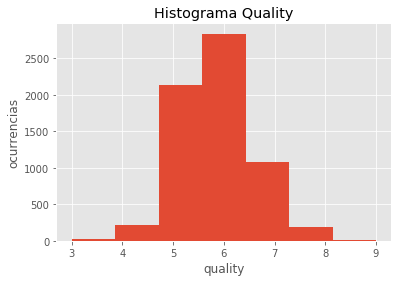

In [190]:
plt.style.use('ggplot')
plt.hist(dsWine01['quality'], bins=7) # se usa bins = 7 porque solo 7 valores tienen
plt.title('Histograma Quality')
plt.xlabel('quality')
plt.ylabel('ocurrencias')
plt.show()

(array([  20.,  163., 1457., 2198.,  880.,  175.,    5.]),
 array([3.        , 3.85714286, 4.71428571, 5.57142857, 6.42857143,
        7.28571429, 8.14285714, 9.        ]),
 <a list of 7 Patch objects>)

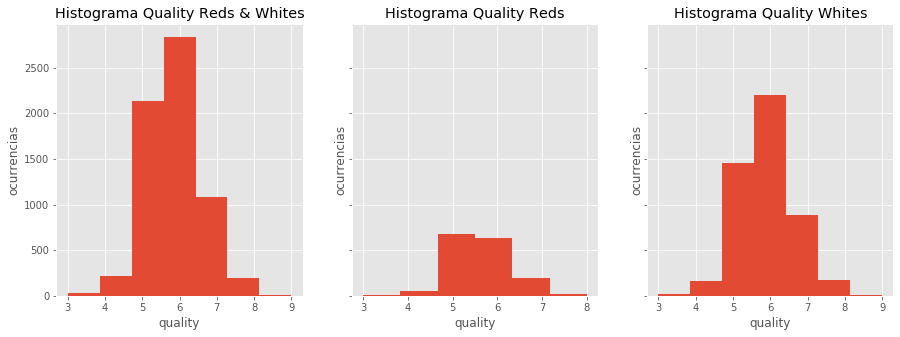

In [232]:
x1 = dsWine01['quality']
x2 = dsWine01[dsWine01.type == 'R']['quality']
x3 = dsWine01[dsWine01.type == 'W']['quality']
fig, axs = plt.subplots(1, 3, sharey=True, tight_layout=False, figsize=(15, 5))
for i in range(3):
    axs[i].set_xlabel('quality')
    axs[i].set_ylabel('ocurrencias')

axs[0].set_title('Histograma Quality Reds & Whites')
axs[0].hist(x1, bins=7)
axs[1].set_title('Histograma Quality Reds')
axs[1].hist(x2, bins=6)
axs[2].set_title('Histograma Quality Whites')
axs[2].hist(x3, bins=7)


In [253]:
pd.concat([x1,x2.rename('quality reds'),x3.rename('quality whites')],axis=1).describe()

,fixed acidity,quality reds,quality whites
count,6497.000000,1599.000000,4898.000000
mean,7.215307,8.319637,6.854788
std,1.296434,1.741096,0.843868
min,3.800000,4.600000,3.800000
25%,6.400000,7.100000,6.300000
50%,7.000000,7.900000,6.800000
75%,7.700000,9.200000,7.300000
max,15.900000,15.900000,14.200000


Dado que el dataset completo contiene mayoría de muestras de evaluaciones de Blancos, el histograma completo y el de blancos son iguales en cuanto a la distribución. El histograma de tintos muestra una concentración entre valores 5 y 6. 

Es posible la necesidad de crear 2 modelos, uno para blancos y otro para tintos.

#### Fixed Acidity (Acidez Fija)

La acidez total puede descomponerse en dos partes, la acidez volátil, compuesta fundamentalmente por el ácido acético, y la acidez fija, en la que se incluyen el resto de ácidos naturales procedentes de la uva (tartárico, málico, cítrico y succínico) o formados en la fermentación maloláctica (láctico).

       fixed acidity  fixed acidity reds  fixed acidity whites
count    6497.000000         1599.000000           4898.000000
mean        7.215307            8.319637              6.854788
std         1.296434            1.741096              0.843868
min         3.800000            4.600000              3.800000
25%         6.400000            7.100000              6.300000
50%         7.000000            7.900000              6.800000
75%         7.700000            9.200000              7.300000
max        15.900000           15.900000             14.200000


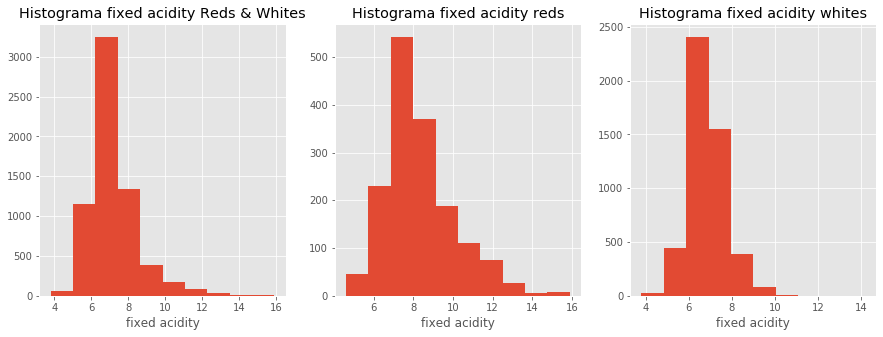

In [265]:
myHistFeature('fixed acidity')

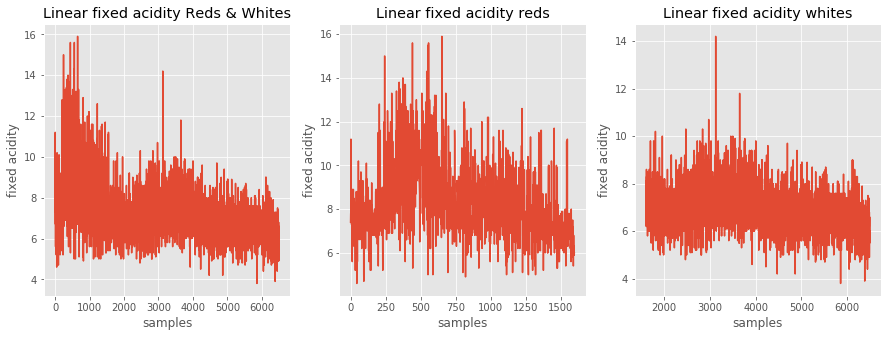

In [294]:
myLinearFeature('fixed acidity')

Los histogramas muestran una marcada concentración de acidez fija entre 6 y 8 para los blancos. Eso explica el 6.85 de promedio con un devstd de .84. 

En cambio para los tintos los valores se concentran entre 6 y 10, lo que hace su promedio más alto 8.32 y un devstd mayor de 1.74.

Los valores son más homogéneos para blancos que para tintos.

Los charts de líneas muestran algunos posibles outliers en blancos con sample(s) con valores 14 o 12. También se observan algunos posibles outliers en valores cercanos a 4. El resto parece ser muy homogéneo. 

En el caso de los tintos, la gráfica es más irregular con más posibles outliers. Solo el análisis específico lo determinará. 

#### Volatile Acidity (Acidez volátil)
Es la proporción de vinagre que tiene el vino. Es un factor claramente indeseable pero inevitable. 

La acidez total puede descomponerse en dos partes, la acidez volátil, compuesta fundamentalmente por el ácido acético, y la acidez fija, en la que se incluyen el resto de ácidos.

Una correcta vinificación en blanco y rosado da un valor de 0,2.

Una correcta vinificación en tinto da un valor de 0,3, y después de la DML es de 0,4 (DML es Desacidificación Maloláctica).

Una vinificación incorrecta da un valor de 0,5.

Un vino comienza a manifestar sensación negativa con valor 0,9.

       volatile acidity  volatile acidity reds  volatile acidity whites
count       6497.000000            1599.000000              4898.000000
mean           0.339666               0.527821                 0.278241
std            0.164636               0.179060                 0.100795
min            0.080000               0.120000                 0.080000
25%            0.230000               0.390000                 0.210000
50%            0.290000               0.520000                 0.260000
75%            0.400000               0.640000                 0.320000
max            1.580000               1.580000                 1.100000


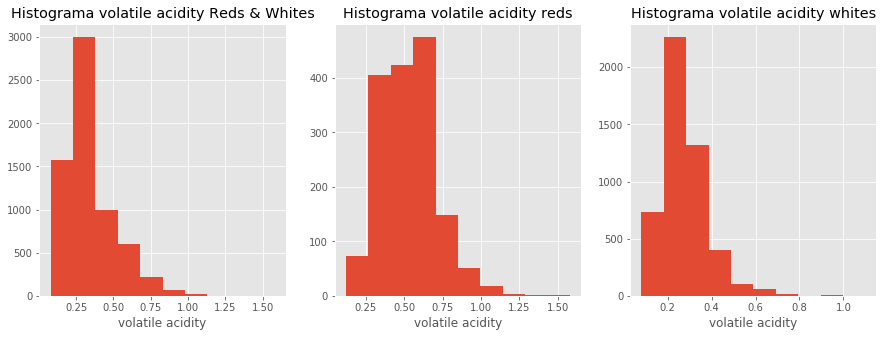

In [268]:
myHistFeature('volatile acidity')

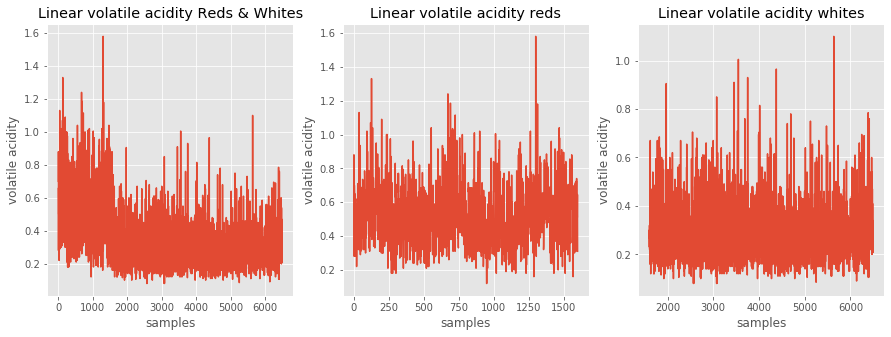

In [295]:
myLinearFeature('volatile acidity')

Interesante: los valores de acidez volátil en tintos tienen un distribución de valores más amplia, entre 0.12 y 1.58, con una concentración mayor entre 0.25 y y 0.75. 

Por otro lado, los blancos oscilan entre 0.1 y 1.10, con una concentración entre 0.2 y 0.4.

El promedio de los tintos está cerca de 0.5, lo cual debería ser una vinificación incorrecta. Por tanto deberían estar muy relacionados con calificaciones malas. 

Por otro lado, el valor promedio en blancos está más cerca de valores de vinificación correcta.

La detección de posibles outliers, en este caso de acidez volátil se comporta al contrario de la acidez fija en tintos y blancos. 

#### Citric acid (ácido cítrico)
el ácido cítrico se encuentra solo en cantidades muy pequeñas en las uvas para vino. A menudo tiene una concentración de aproximadamente 1/20 la del ácido tartárico. El ácido cítrico más comúnmente encontrado en el vino son los suplementos ácidos producidos comercialmente derivados de la fermentación de soluciones de sacarosa.

       citric acid  citric acid reds  citric acid whites
count  6497.000000       1599.000000         4898.000000
mean      0.318633          0.270976            0.334192
std       0.145318          0.194801            0.121020
min       0.000000          0.000000            0.000000
25%       0.250000          0.090000            0.270000
50%       0.310000          0.260000            0.320000
75%       0.390000          0.420000            0.390000
max       1.660000          1.000000            1.660000


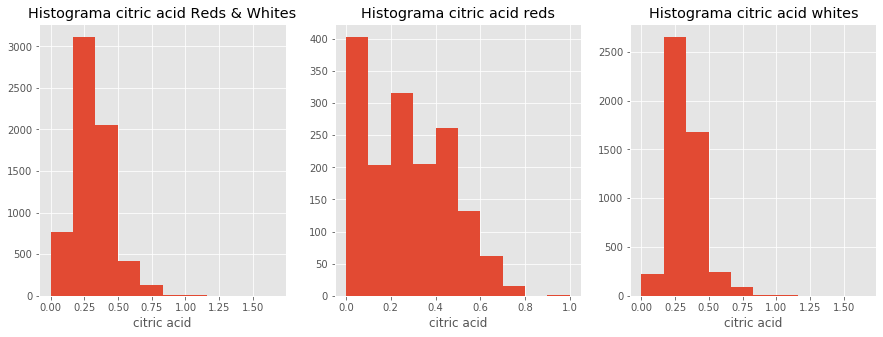

In [269]:
myHistFeature('citric acid')

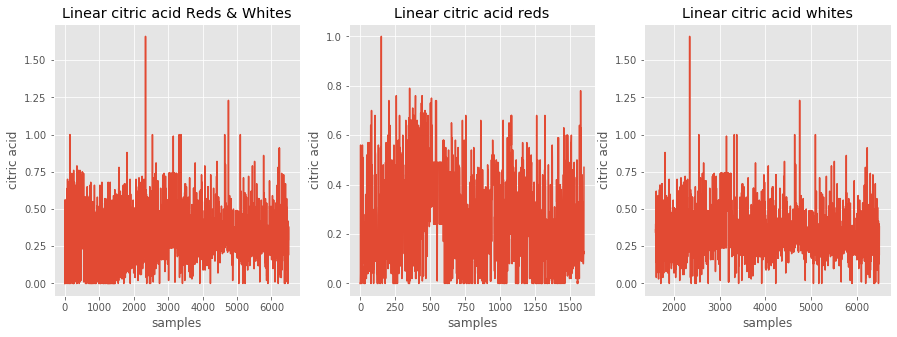

In [296]:
myLinearFeature('citric acid')

Los niveles de ácido cítrico en blancos se encuentra muy concentrada entre 0.25 y 0.5. Sin embargo, en los tintos, existen concentraciones irregulares en 0.1, 0.2, 0.3 y 0.5. Esto hace que el promedio en tintos sea menor pero con una devstd mayor a la de blancos.

Las líneas reflejan posibles outliers en ambos tipos de vino. Esta variable también debe pasar por ese análisis.

#### pH
La acidez le da al vino su sabor ácido y agrio. Básicamente, todos los vinos se encuentran en el lado ácido del espectro de pH y la mayoría varía de 2.5 a aproximadamente 4.5 pH (7 es neutral). Hay varios tipos diferentes de ácidos que se encuentran en el vino que afectarán el sabor ácido de un vino. Los ácidos más prevalentes que se encuentran en el vino son el ácido tartárico, el ácido málico y el ácido cítrico.

                pH      pH reds    pH whites
count  6497.000000  1599.000000  4898.000000
mean      3.218501     3.311113     3.188267
std       0.160787     0.154386     0.151001
min       2.720000     2.740000     2.720000
25%       3.110000     3.210000     3.090000
50%       3.210000     3.310000     3.180000
75%       3.320000     3.400000     3.280000
max       4.010000     4.010000     3.820000


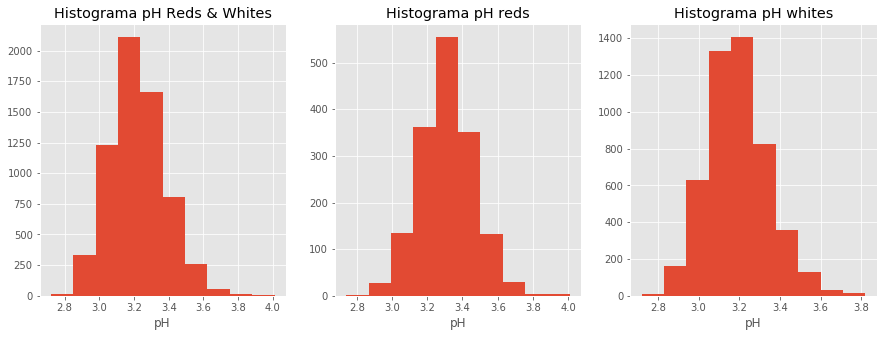

In [270]:
myHistFeature('pH')

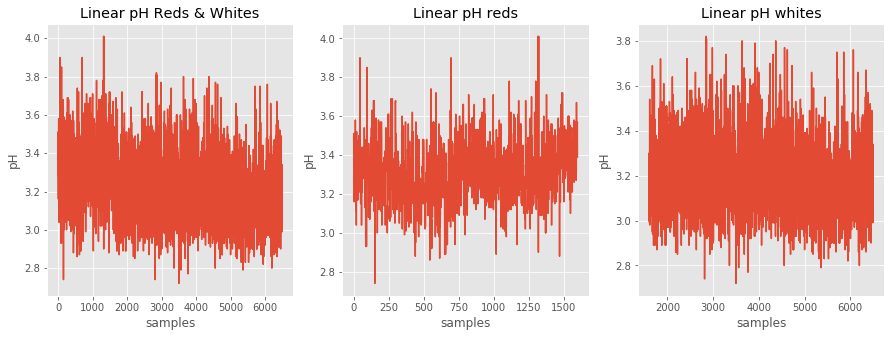

In [297]:
myLinearFeature('pH')

En general, la distribución del PH en ambos datasets es similar, con valores levemente más bajos en tintos que en blancos

#### Residual sugar (Azúcar residual)
El azúcar residual (o RS) proviene de los azúcares de uva naturales que quedan en un vino después de que finaliza la fermentación alcohólica. Se mide en gramos por litro.

       residual sugar  residual sugar reds  residual sugar whites
count     6497.000000          1599.000000            4898.000000
mean         5.443235             2.538806               6.391415
std          4.757804             1.409928               5.072058
min          0.600000             0.900000               0.600000
25%          1.800000             1.900000               1.700000
50%          3.000000             2.200000               5.200000
75%          8.100000             2.600000               9.900000
max         65.800000            15.500000              65.800000


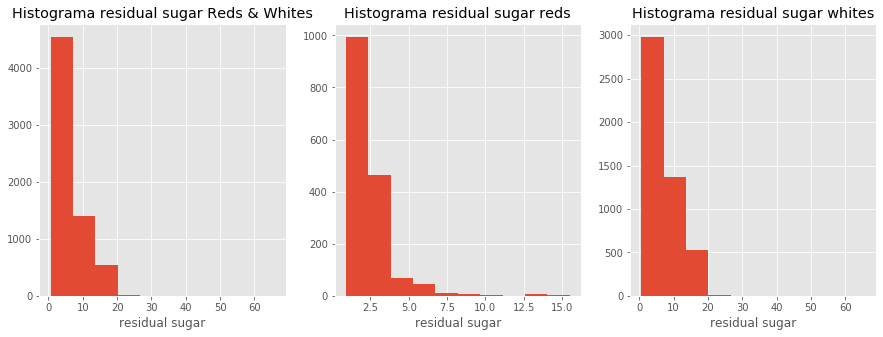

In [271]:
myHistFeature('residual sugar')

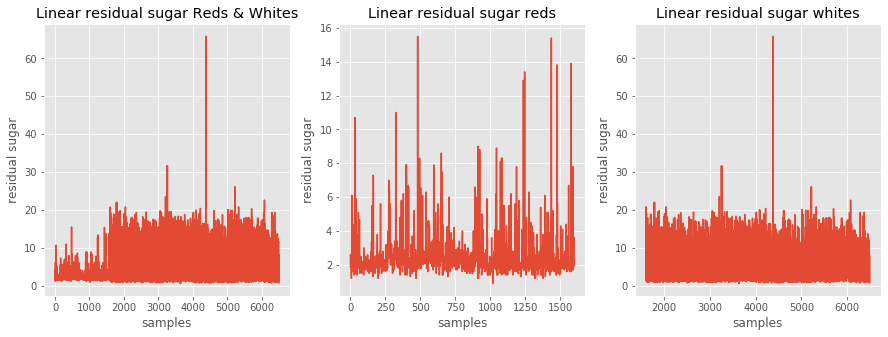

In [298]:
myLinearFeature('residual sugar')

Los tintos tienden a ser menos dulces que los blancos, centrando el azúcar residual por debajo de 3. Aunque los blancos tiendne a estar por debajo de 5, un cantidad importante está entre 10 y 20.

##### Importante: outlier muy marcado en los blancos. Debe revisarse

#### Chlorides (Cloruros)
Componentes sales del vino. 

         chlorides  chlorides reds  chlorides whites
count  6497.000000     1599.000000       4898.000000
mean      0.056034        0.087467          0.045772
std       0.035034        0.047065          0.021848
min       0.009000        0.012000          0.009000
25%       0.038000        0.070000          0.036000
50%       0.047000        0.079000          0.043000
75%       0.065000        0.090000          0.050000
max       0.611000        0.611000          0.346000


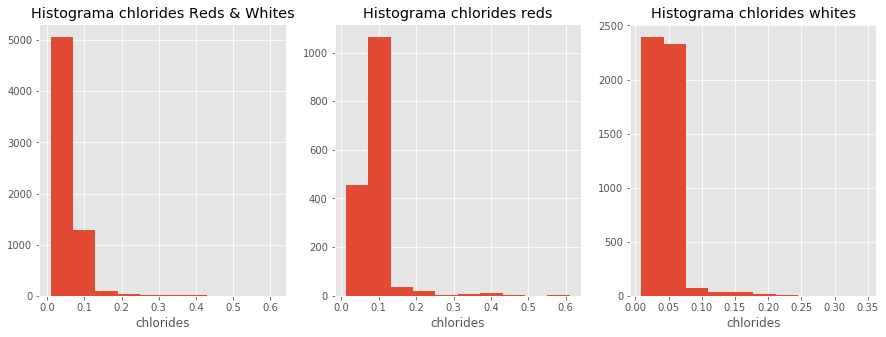

In [274]:
myHistFeature('chlorides')

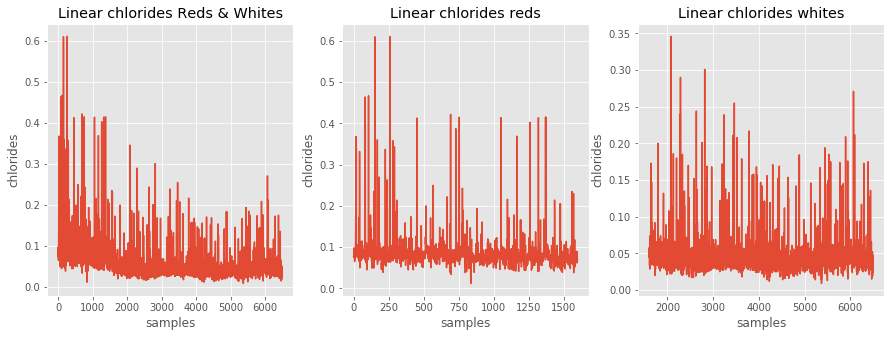

In [299]:
myLinearFeature('chlorides')

Los niveles de sales (cloruros) son más bajos en blancos que en tintos (doblan el valor). Los valores en ambos grupos están claramente agrupados por de bajo de 0.1 en tintos y por debajo de 0.075 en blancos.

#### free sulfur dioxide (dioxido de azufre libre)
El dioxido de azufre es un potente antimicrobiano que, además, es valioso por sus funciones antioxidantes. Dos favores que, con el paso del tiempo, se han puesto en entredicho a pesar de sus virtudes y la tradición de su uso.

El problema es que el dióxido de azufre que realiza esta función es el molecular. El libre no es bueno en altas cantidades en el vino

       free sulfur dioxide  free sulfur dioxide reds  \
count          6497.000000               1599.000000   
mean             30.525319                 15.874922   
std              17.749400                 10.460157   
min               1.000000                  1.000000   
25%              17.000000                  7.000000   
50%              29.000000                 14.000000   
75%              41.000000                 21.000000   
max             289.000000                 72.000000   

       free sulfur dioxide whites  
count                 4898.000000  
mean                    35.308085  
std                     17.007137  
min                      2.000000  
25%                     23.000000  
50%                     34.000000  
75%                     46.000000  
max                    289.000000  


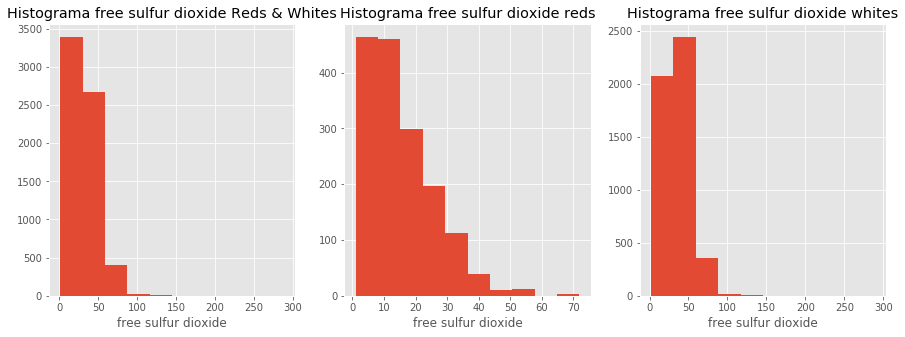

In [275]:
myHistFeature('free sulfur dioxide')

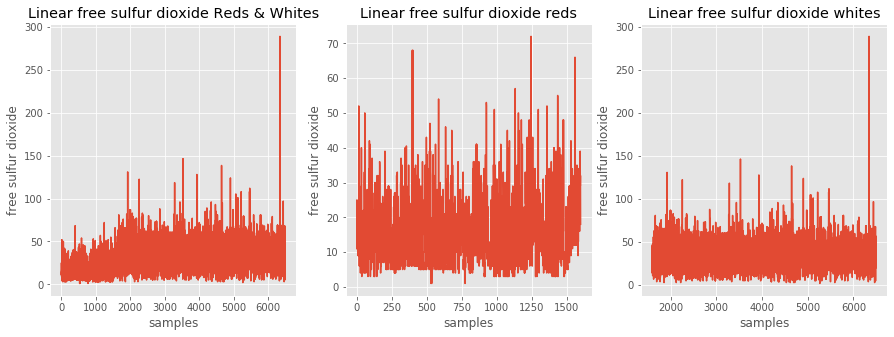

In [300]:
myLinearFeature('free sulfur dioxide')

La presencia de dióxido de azufre libre tiende a ser menor en los tintos que en los blancos. Desde el punto de vista de salud, en este caso los tintos tienden a tener mejores índices que los blancos.

##### Importante: posible outlier en blancos. Muy marcado

#### Total sulfur dioxide (Dióxido de azufre total)

       total sulfur dioxide  total sulfur dioxide reds  \
count           6497.000000                1599.000000   
mean             115.744574                  46.467792   
std               56.521855                  32.895324   
min                6.000000                   6.000000   
25%               77.000000                  22.000000   
50%              118.000000                  38.000000   
75%              156.000000                  62.000000   
max              440.000000                 289.000000   

       total sulfur dioxide whites  
count                  4898.000000  
mean                    138.360657  
std                      42.498065  
min                       9.000000  
25%                     108.000000  
50%                     134.000000  
75%                     167.000000  
max                     440.000000  


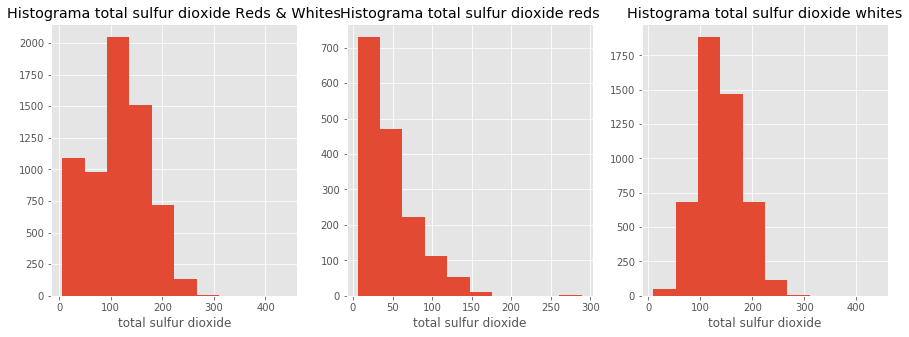

In [276]:
myHistFeature('total sulfur dioxide')

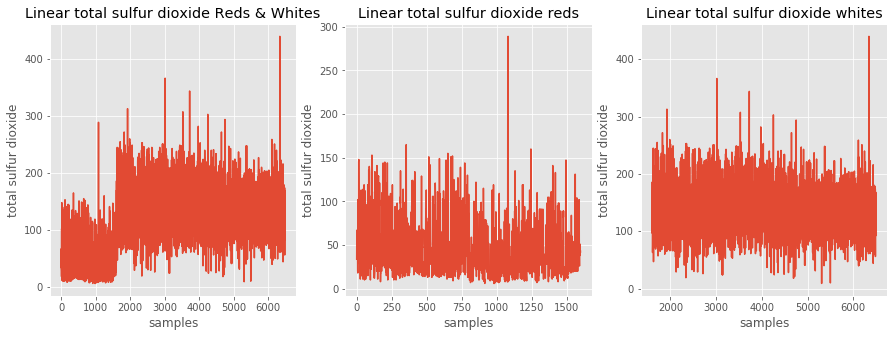

In [301]:
myLinearFeature('total sulfur dioxide')

El patrón de dióxido de azufre total es similar al del dióxido de azufre libre en los tintos. La mayor concentración está por debajo de 75. En cambio en los blancos los valores están entre 100 y 200.

##### Importante: no prestar atención al gráfico 1. Es porque los datos están ordenados por el tipo de vino. Importante: posible outlier en tintos y blancos.

#### Density (Densidad)
Es un parámetro que en cata se percibe como estructura del vino o espesor en boca. Como criterio de calidad consideramos como buenos vinos aquellos que son ligeros, pero con cuerpo.

           density  density reds  density whites
count  6497.000000   1599.000000     4898.000000
mean      0.994697      0.996747        0.994027
std       0.002999      0.001887        0.002991
min       0.987110      0.990070        0.987110
25%       0.992340      0.995600        0.991723
50%       0.994890      0.996750        0.993740
75%       0.996990      0.997835        0.996100
max       1.038980      1.003690        1.038980


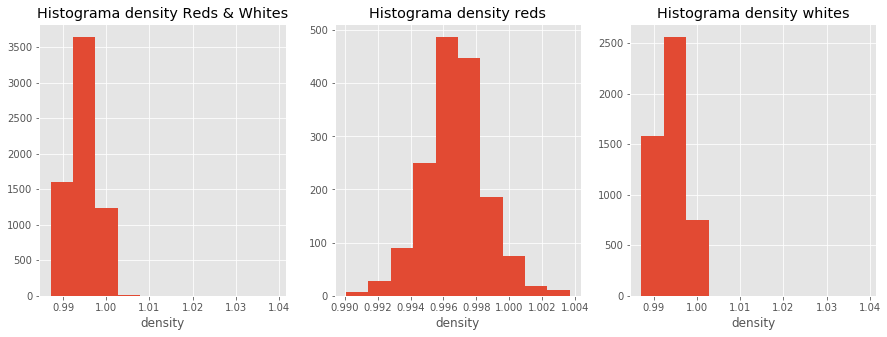

In [277]:
myHistFeature('density')

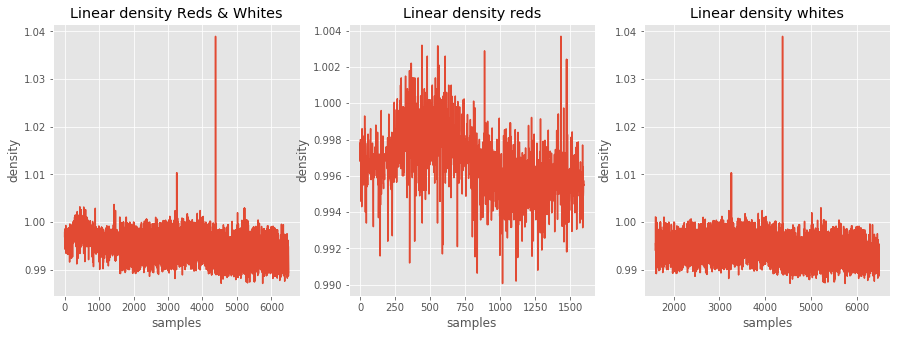

In [302]:
myLinearFeature('density')

Interesante, la densidad del vino blanco está muy concentrada en valores entre .99 y 1. Por otro lado los valores de densidad del tinto tienen mediciones más precisas con una concentración mayor entre .995 y .999.

##### Importante: outlier en blancos. Muy homogénea la muestra de blancos. Con más variantes en tintos, pero sin outlier aparente.

#### Sulphates (sulfatos)
Sulfatos son las sales derivadas del ácido sulfúrico utilizados básicamente en fertilizantes, pesticidas, colorantes, jabones, vidrios, papel fármacos y con una pequeña representación de productos como aditivo en productos alimentarios.

Los sulfatos de sodio y calcio aparecen en el agua y por lo tanto la uva y el vino pueden contenerlos. Una alta concentración de los mismos podría hacer que un agua no fuera de calidad alimentaria. Un agua con una cantidad de sulfatos inferior a 250mg/l se considera en este aspecto un agua de calidad y con valores superiores a 400mg/l insalubre.

         sulphates  sulphates reds  sulphates whites
count  6497.000000     1599.000000       4898.000000
mean      0.531268        0.658149          0.489847
std       0.148806        0.169507          0.114126
min       0.220000        0.330000          0.220000
25%       0.430000        0.550000          0.410000
50%       0.510000        0.620000          0.470000
75%       0.600000        0.730000          0.550000
max       2.000000        2.000000          1.080000


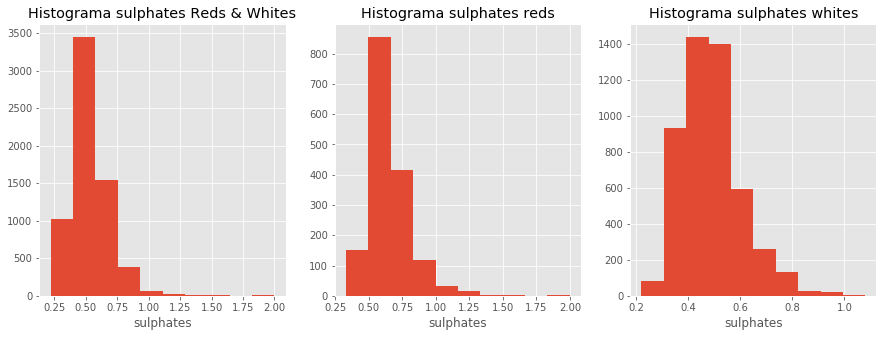

In [279]:
myHistFeature('sulphates')

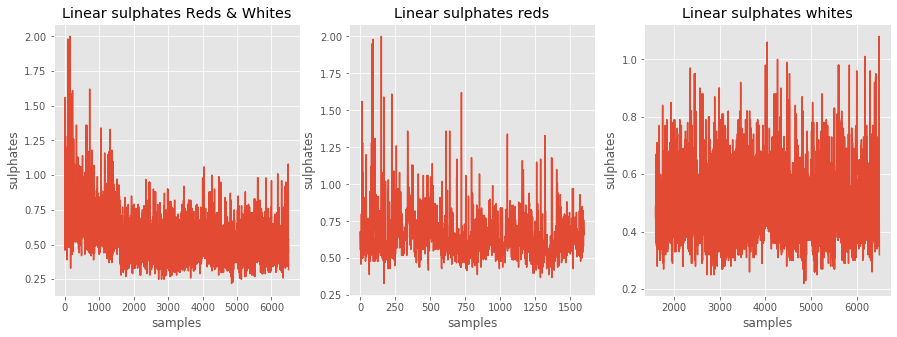

In [303]:
myLinearFeature('sulphates')

Los sulfatos en el vino se concentran entre 0.5 y 0.75 mientras que en el vino blanco estpan entre 0.3 y 0.6.

#### Alcohol

           alcohol  alcohol reds  alcohol whites
count  6497.000000   1599.000000     4898.000000
mean     10.491801     10.422983       10.514267
std       1.192712      1.065668        1.230621
min       8.000000      8.400000        8.000000
25%       9.500000      9.500000        9.500000
50%      10.300000     10.200000       10.400000
75%      11.300000     11.100000       11.400000
max      14.900000     14.900000       14.200000


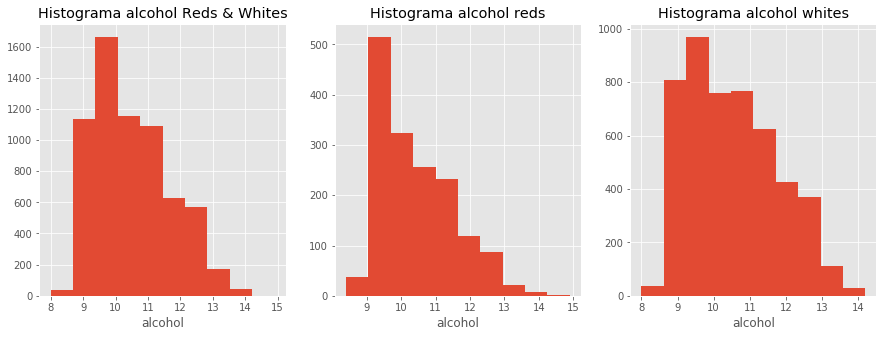

In [280]:
myHistFeature('alcohol')

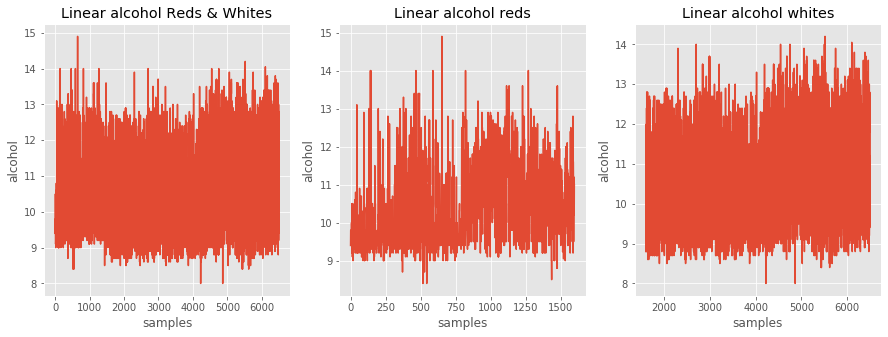

In [305]:
myLinearFeature('alcohol')

Los niveles del alcohol son similares en ambos tipos de vino

### Análisis de relaciones entre variables con scatter

#### Funciones para graficar
Las siguientes son funciones para facilitar la generación de gráfico scatter. Hay dos versiones una que simplemente cruza valores. La otra función agrega leyendas a los puntos según Quality.

In [362]:
def myScatterFeatures(featureX, featureY):
    x1 = dsWine01[featureX]
    x2 = dsWine01[dsWine01.type == 'R'][featureX]
    x3 = dsWine01[dsWine01.type == 'W'][featureX]

    y1 = dsWine01[featureY]
    y2 = dsWine01[dsWine01.type == 'R'][featureY]
    y3 = dsWine01[dsWine01.type == 'W'][featureY]
    
    fig, axs = plt.subplots(1, 3, sharey=True, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_ylabel(featureY)
        axs[i].set_xlabel(featureX)

    axs[0].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nReds & Whites')
    axs[0].scatter(x1,y1)
    axs[1].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nReds')
    axs[1].scatter(x2,y2)
    axs[2].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nWhites')
    axs[2].scatter(x3,y3)
    plt.show()
  

def myScatterFeaturesLabelQlty(featureX, featureY):
    x1 = dsWine01[featureX]
    x2 = dsWine01[dsWine01.type == 'R'][featureX]
    x3 = dsWine01[dsWine01.type == 'W'][featureX]

    y1 = dsWine01[featureY]
    y2 = dsWine01[dsWine01.type == 'R'][featureY]
    y3 = dsWine01[dsWine01.type == 'W'][featureY]
    
    g1 = dsWine01['quality']
    g2 = dsWine01[dsWine01.type == 'R']['quality']
    g3 = dsWine01[dsWine01.type == 'W']['quality']
    
    fig, axs = plt.subplots(1, 3, sharey=True, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_ylabel(featureY)
        axs[i].set_xlabel(featureX)


    axs[0].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nReds & Whites')
    sca1 = axs[0].scatter(x1,y1,c=g1,alpha=0.3)
    leg1 = axs[0].legend(*sca1.legend_elements(), loc="upper right", title="Quality")
    axs[0].add_artist(leg1)
    
    axs[1].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nReds')
    sca2 = axs[1].scatter(x2,y2,c=g2,alpha=0.3)
    leg2 = axs[1].legend(*sca2.legend_elements(), loc="upper right", title="Quality")
    axs[1].add_artist(leg2)
    
    axs[2].set_title('Scatter ' + featureX  +' \nvs ' + featureY + '\nWhites')
    sca3 = axs[2].scatter(x3,y3,c=g3,alpha=0.3)
    leg3 = axs[2].legend(*sca3.legend_elements(), loc="upper right", title="Quality")
    axs[2].add_artist(leg3)

    plt.show()
    

In [351]:
cols = dsWine01.columns
print(cols)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type', 'qualityf', 'type_red',
       'type_white'],
      dtype='object')


#### Generación de gráficos scatter cruzando todas las variables

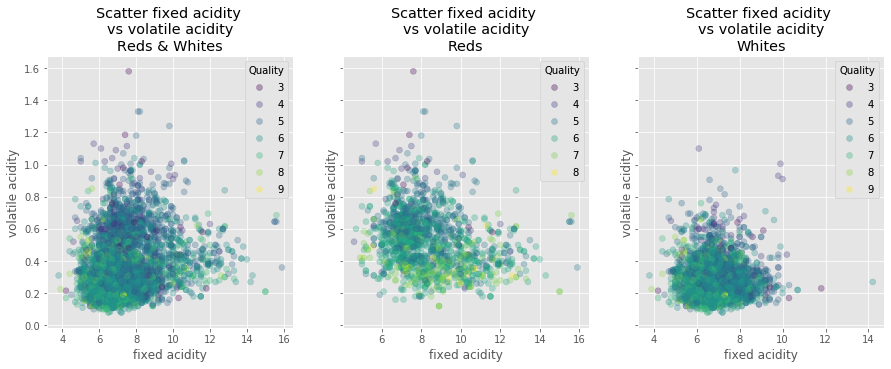

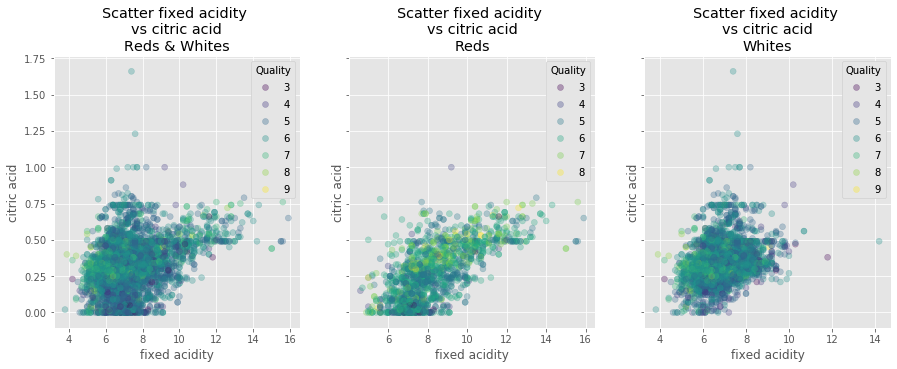

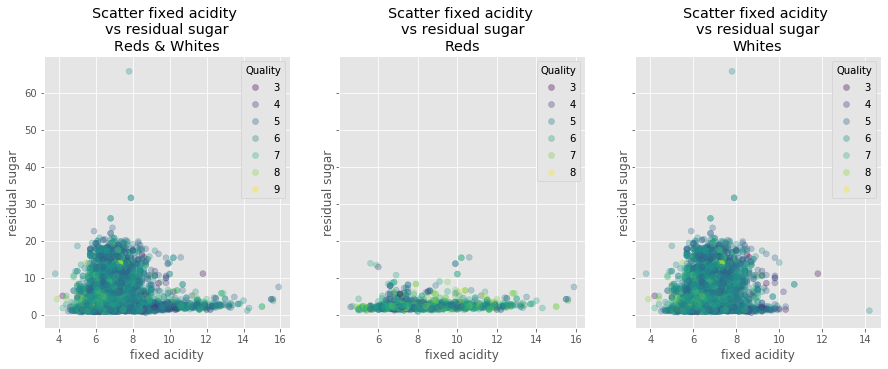

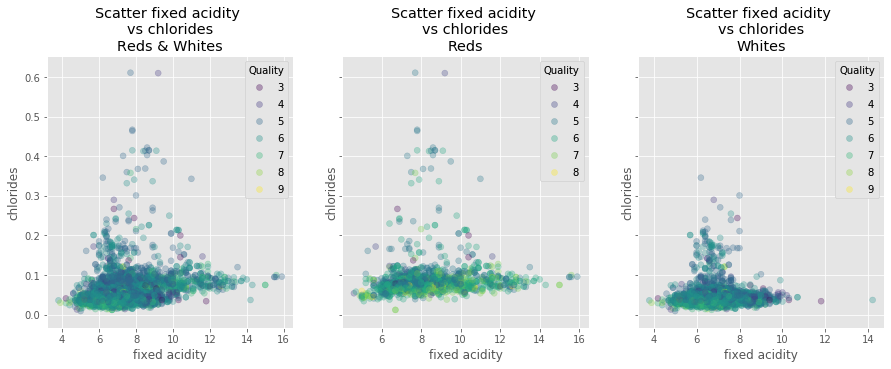

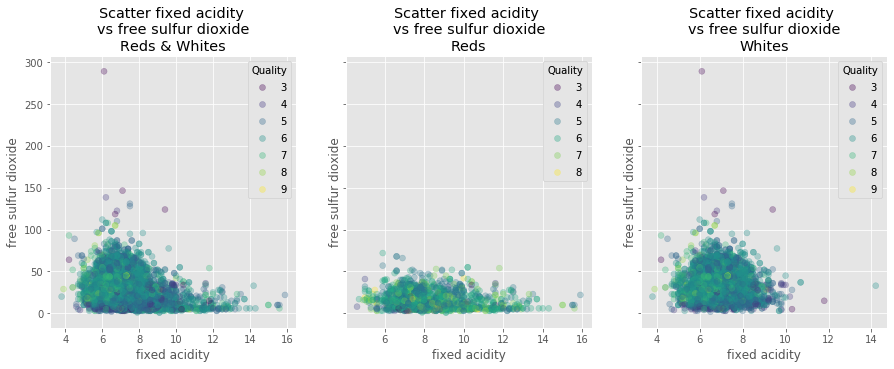

...

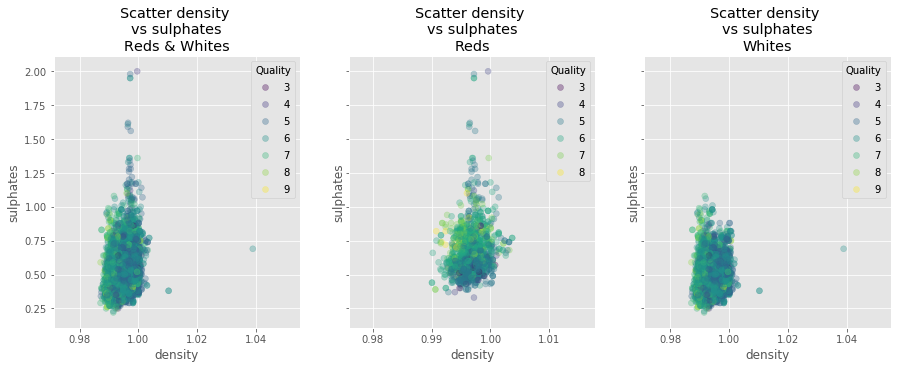

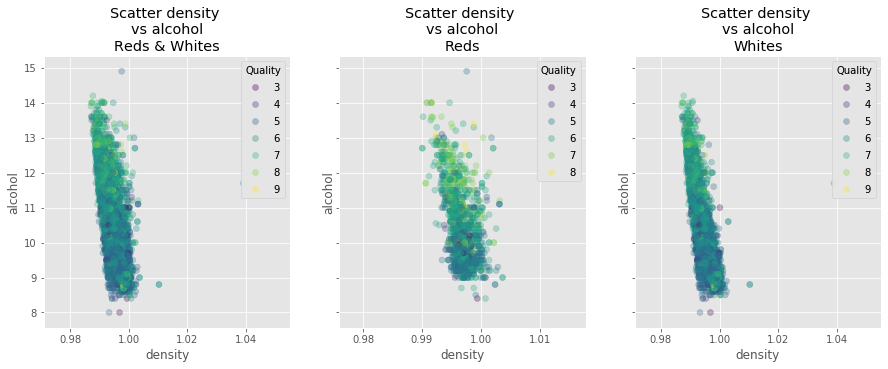

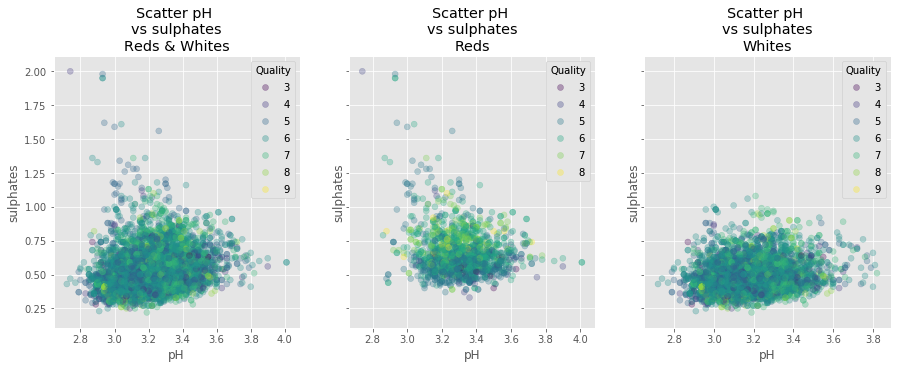

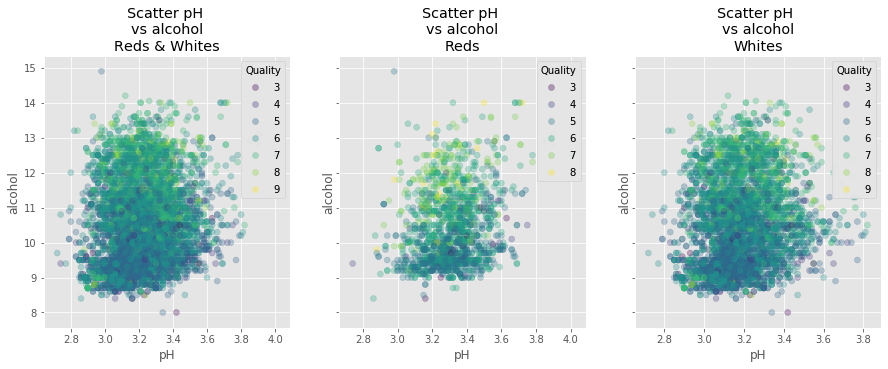

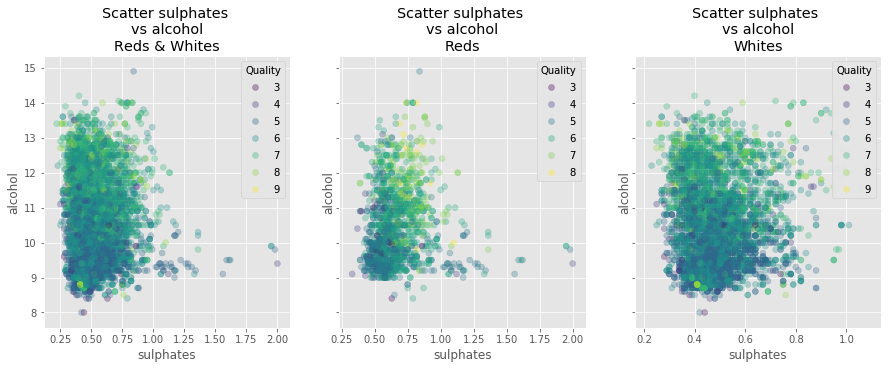

In [363]:
n = 11
for i in range(n):
    i2 = i+1
    for i2 in range(i2,n):
        myScatterFeaturesLabelQlty(cols[i],cols[i2])

### Box plots

In [360]:
def myScatterFeatures(feature):
    x1 = dsWine01[feature]
    x2 = dsWine01[dsWine01.type == 'R'][feature]
    x3 = dsWine01[dsWine01.type == 'W'][feature]


    fig, axs = plt.subplots(1, 3, sharey=True, tight_layout=False, figsize=(15, 5))
    for i in range(3):
        axs[i].set_xlabel(feature)

    axs[0].set_title('Box plot ' + feature  +' \nReds & Whites')
    axs[0].boxplot(x1,False,'gD')
    axs[1].set_title('Box plot ' + feature  +' \nReds')
    axs[1].boxplot(x2,False,'gD')
    axs[2].set_title('Box plot ' + feature  +' \nWhites')
    axs[2].boxplot(x3,False,'gD')
    plt.show()
    

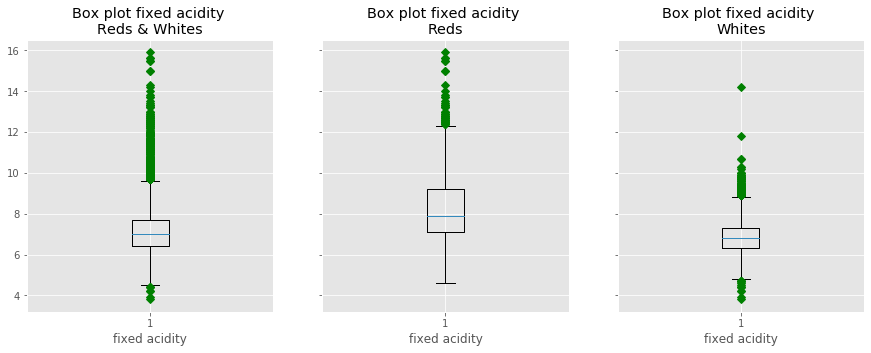

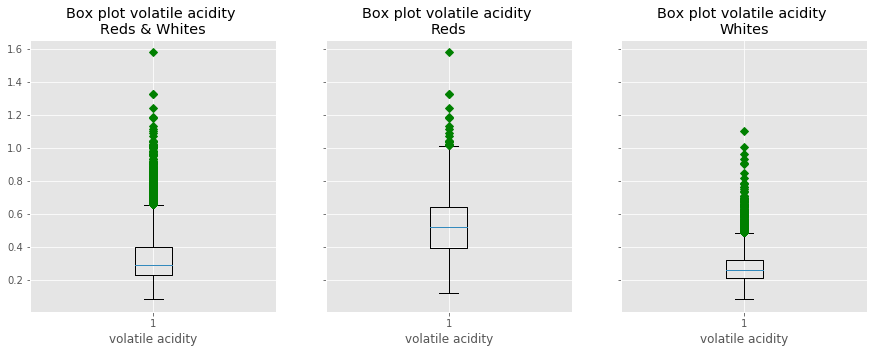

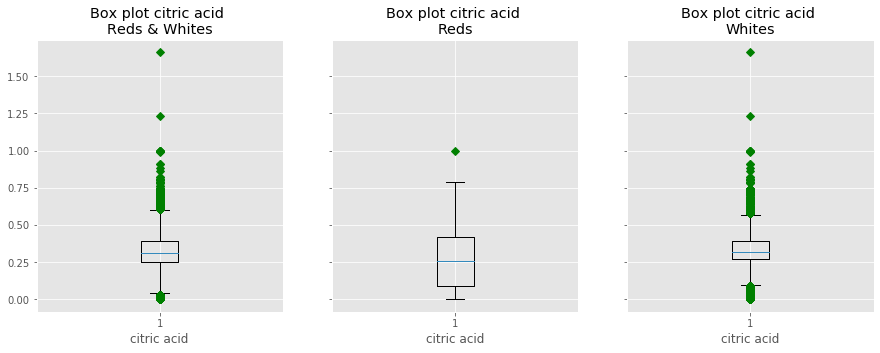

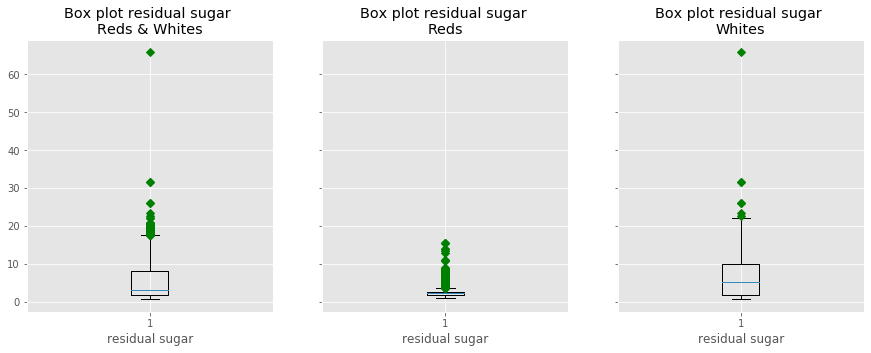

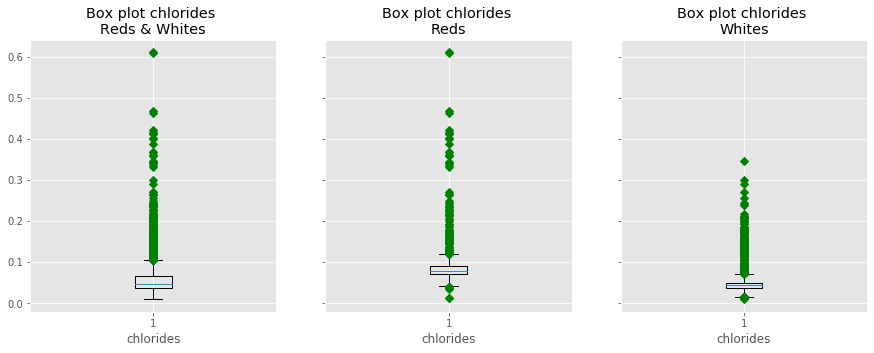

...

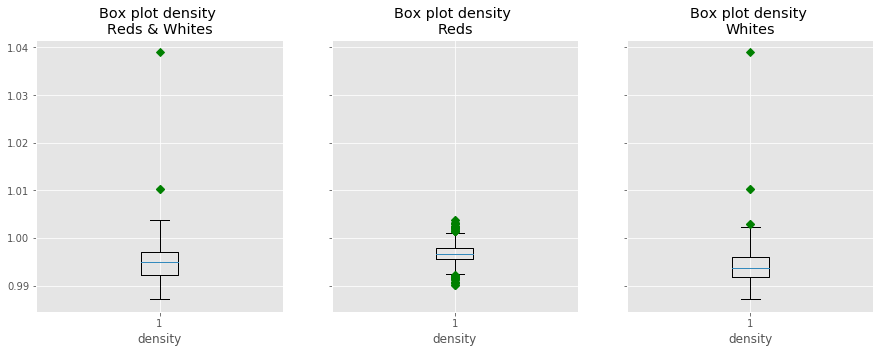

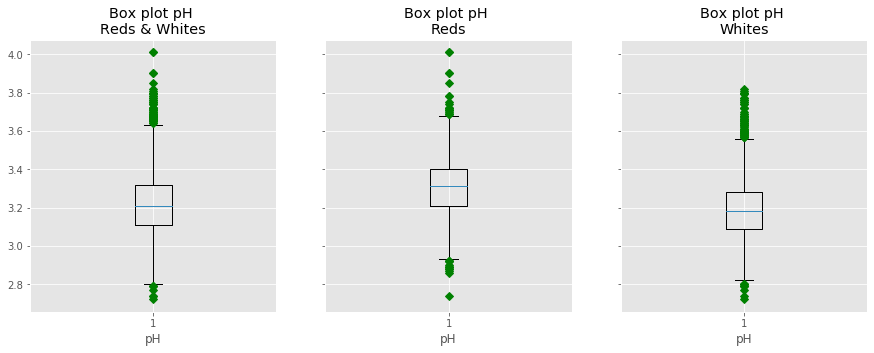

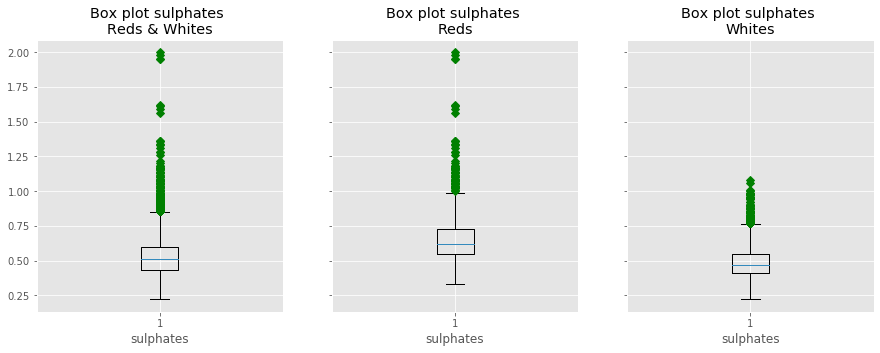

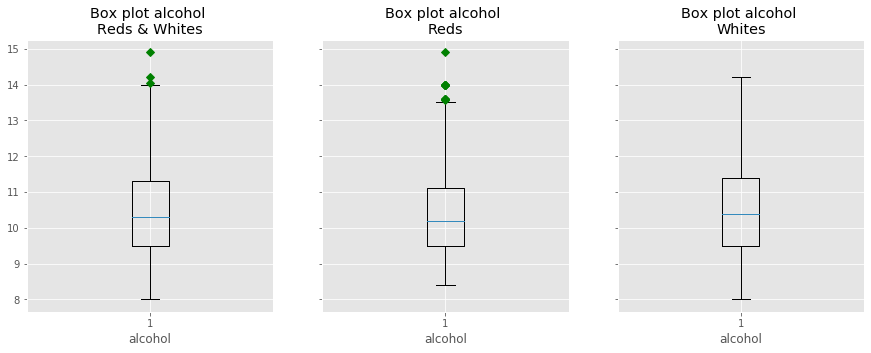

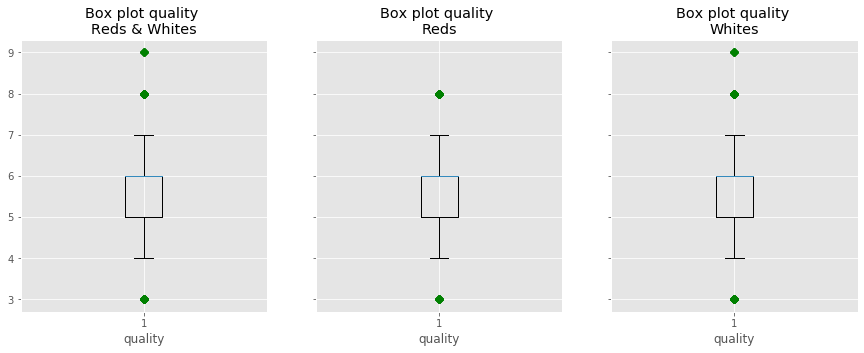

In [361]:
n = 12
for i in range(n):
    myScatterFeatures(cols[i])

## Correlación
### Correlación de Dataset Completo (tintos y blancos)

In [488]:
## esta función se utilizará para graficar matrices de correlación y varianza
def myMatrixHeatmap(matrix, title):
    fig, ax = plt.subplots(figsize=(15,10))       
    sns.heatmap(matrix, annot=True, ax=ax, cmap="coolwarm")
    ax.set_yticklabels(ax.get_yticklabels(), rotation = 0)
    b, t = plt.ylim() # discover the values for bottom and top
    b += 0.5 # Add 0.5 to the bottom
    t -= 0.5 # Subtract 0.5 from the top
    plt.ylim(b, t) # update the ylim(bottom, top) values
    plt.title(title)
    plt.show() # ta-da!

In [489]:
corrMat = dsWine01.corr()
corrMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
fixed acidity,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743,0.486740,-0.486740
volatile acidity,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699,0.653036,-0.653036
citric acid,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532,-0.187397,0.187397
residual sugar,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980,-0.348821,0.348821
chlorides,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666,0.512678,-0.512678
free sulfur dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463,-0.471644,0.471644
total sulfur dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385,-0.700357,0.700357
density,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858,0.390645,-0.390645
pH,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506,0.329129,-0.329129
sulphates,0.299568,0.225984,0.056197,-0.185927,0.395593,-0.188457,-0.275727,0.259478,0.192123,1.000000,-0.003029,0.038485,0.487218,-0.487218


Graficar mapa de calor de la matriz de correlación

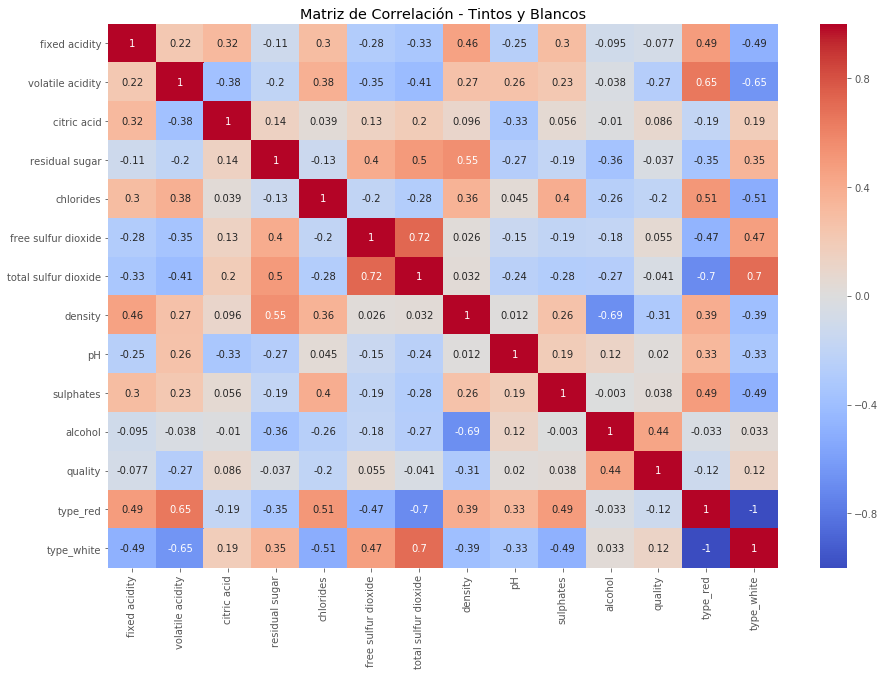

In [490]:
myMatrixHeatmap(corrMat, "Matriz de Correlación - Tintos y Blancos")

In [491]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nTintos y Blancos\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Tintos y Blancos


free sulfur dioxide   total sulfur dioxide    0.720934
total sulfur dioxide  free sulfur dioxide     0.720934
type_white            total sulfur dioxide    0.700357
total sulfur dioxide  type_red                0.700357
type_red              total sulfur dioxide    0.700357
total sulfur dioxide  type_white              0.700357
density               alcohol                 0.686745
alcohol               density                 0.686745
volatile acidity      type_red                0.653036
type_red              volatile acidity        0.653036
volatile acidity      type_white              0.653036
type_white            volatile acidity        0.653036
dtype: float64

### Correlación de Dataset solo Tintos

In [492]:
dsWine01R = dsWine01.copy()
dsWine01R = dsWine01R[dsWine01R.type_red == 1]
dsWine01R.drop(['type_red','type_white'], axis=1, inplace=True)
corrMat = dsWine01R.corr()
corrMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


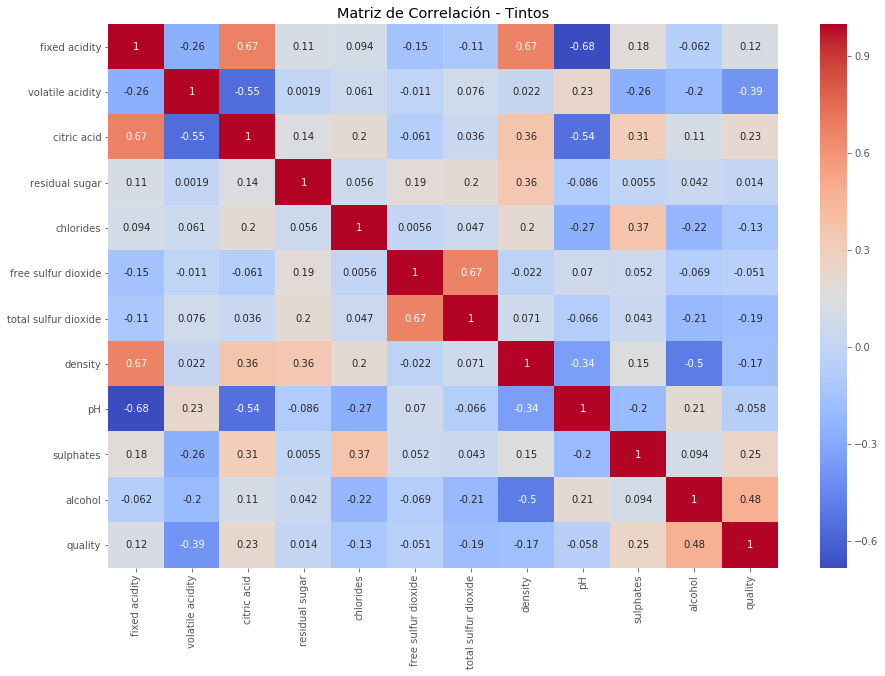

In [493]:
myMatrixHeatmap(corrMat, "Matriz de Correlación - Tintos")

In [494]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nTintos Solamente\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Tintos Solamente


pH                    fixed acidity           0.682978
fixed acidity         pH                      0.682978
                      citric acid             0.671703
citric acid           fixed acidity           0.671703
fixed acidity         density                 0.668047
density               fixed acidity           0.668047
total sulfur dioxide  free sulfur dioxide     0.667666
free sulfur dioxide   total sulfur dioxide    0.667666
dtype: float64

### Correlación solo Blancos

In [495]:
dsWine01W = dsWine01.copy()
dsWine01W = dsWine01W[dsWine01W.type_white == 1]
dsWine01W.drop(['type_red','type_white'], axis=1, inplace=True)
corrMat = dsWine01W.corr()
corrMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.022697,0.289181,0.089021,0.023086,-0.049396,0.091070,0.265331,-0.425858,-0.017143,-0.120881,-0.113663
volatile acidity,-0.022697,1.000000,-0.149472,0.064286,0.070512,-0.097012,0.089261,0.027114,-0.031915,-0.035728,0.067718,-0.194723
citric acid,0.289181,-0.149472,1.000000,0.094212,0.114364,0.094077,0.121131,0.149503,-0.163748,0.062331,-0.075729,-0.009209
residual sugar,0.089021,0.064286,0.094212,1.000000,0.088685,0.299098,0.401439,0.838966,-0.194133,-0.026664,-0.450631,-0.097577
chlorides,0.023086,0.070512,0.114364,0.088685,1.000000,0.101392,0.198910,0.257211,-0.090439,0.016763,-0.360189,-0.209934
free sulfur dioxide,-0.049396,-0.097012,0.094077,0.299098,0.101392,1.000000,0.615501,0.294210,-0.000618,0.059217,-0.250104,0.008158
total sulfur dioxide,0.091070,0.089261,0.121131,0.401439,0.198910,0.615501,1.000000,0.529881,0.002321,0.134562,-0.448892,-0.174737
density,0.265331,0.027114,0.149503,0.838966,0.257211,0.294210,0.529881,1.000000,-0.093591,0.074493,-0.780138,-0.307123
pH,-0.425858,-0.031915,-0.163748,-0.194133,-0.090439,-0.000618,0.002321,-0.093591,1.000000,0.155951,0.121432,0.099427
sulphates,-0.017143,-0.035728,0.062331,-0.026664,0.016763,0.059217,0.134562,0.074493,0.155951,1.000000,-0.017433,0.053678


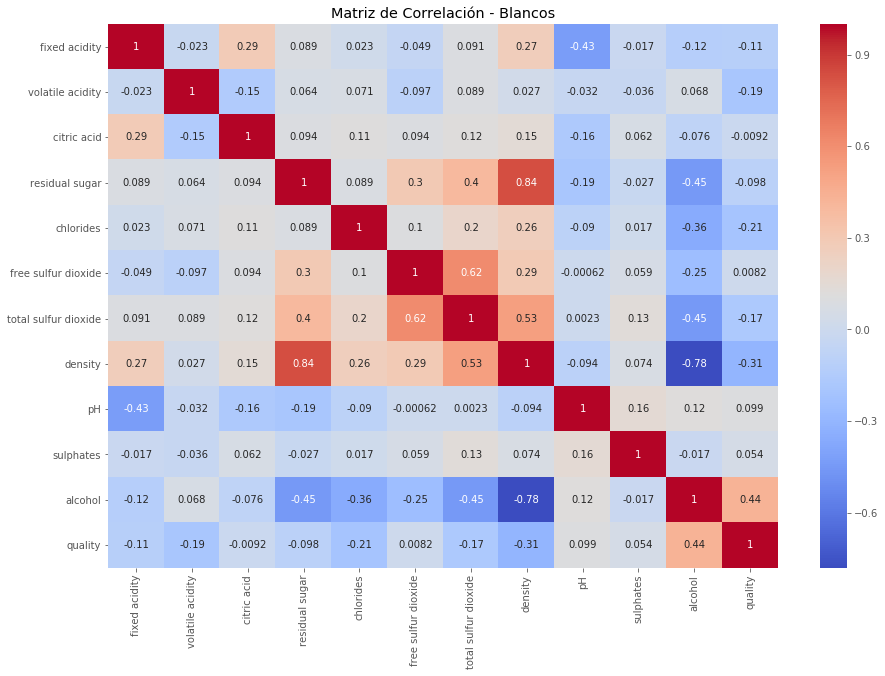

In [496]:
myMatrixHeatmap(corrMat, "Matriz de Correlación - Blancos")

In [497]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nBlancos Solamente\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Blancos Solamente


residual sugar  density           0.838966
density         residual sugar    0.838966
                alcohol           0.780138
alcohol         density           0.780138
dtype: float64

En blancos si existe una correlación "apenas" fuerte entre Residual Sugar y Density. Además existe otra un poco más leve entre alcohol y densidad. Estas correlaciones no se observan en el dataset de tintos ni en el consolidad. Esto refuerza la tesis que son datasets distintos por tanto requiere modelos distintos.

## Covarianza sin eliminar Outliers
### Covarianza del DataSet Completo

In [498]:
covMat = dsWine01.cov()
covMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
fixed acidity,1.680740,0.046745,0.061122,-0.690720,0.013544,-6.506003,-24.112030,0.001784,-0.052675,0.057792,-0.147594,-0.086882,0.271833,-0.271833
volatile acidity,0.046745,0.027105,-0.009043,-0.153537,0.002175,-1.030242,-3.856933,0.000134,0.006921,0.005536,-0.007391,-0.038200,0.046315,-0.046315
citric acid,0.061122,-0.009043,0.021117,0.098490,0.000199,0.343372,1.603646,0.000042,-0.007706,0.001215,-0.001819,0.010854,-0.011731,0.011731
residual sugar,-0.690720,-0.153537,0.098490,22.636696,-0.021492,34.021685,133.244854,0.007883,-0.204498,-0.131635,-2.039567,-0.153646,-0.714930,0.714930
chlorides,0.013544,0.002175,0.000199,-0.021492,0.001227,-0.121284,-0.553714,0.000038,0.000252,0.002062,-0.010735,-0.006139,0.007737,-0.007737
free sulfur dioxide,-6.506003,-1.030242,0.343372,34.021685,-0.121284,315.041192,723.261972,0.001369,-0.416249,-0.497756,-3.807165,0.859664,-3.606217,3.606217
total sulfur dioxide,-24.112030,-3.856933,1.603646,133.244854,-0.553714,723.261972,3194.720039,0.005491,-2.166696,-2.319079,-17.914646,-2.042704,-17.052582,17.052582
density,0.001784,0.000134,0.000042,0.007883,0.000038,0.001369,0.005491,0.000009,0.000006,0.000116,-0.002456,-0.000801,0.000505,-0.000505
pH,-0.052675,0.006921,-0.007706,-0.204498,0.000252,-0.416249,-2.166696,0.000006,0.025853,0.004597,0.023252,0.002739,0.022797,-0.022797
sulphates,0.057792,0.005536,0.001215,-0.131635,0.002062,-0.497756,-2.319079,0.000116,0.004597,0.022143,-0.000538,0.005001,0.031232,-0.031232


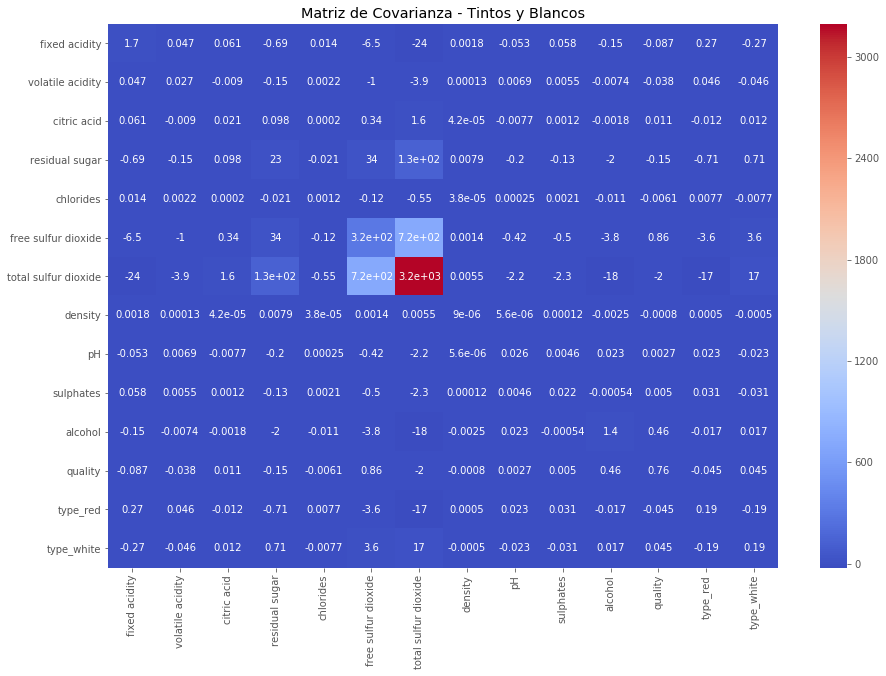

In [499]:
myMatrixHeatmap(covMat, "Matriz de Covarianza - Tintos y Blancos")

### Covarianza Dataset Tintos

In [500]:
covMat = dsWine01R.cov()
covMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,3.031416,-0.079851,0.227820,0.281756,0.007679,-2.800921,-6.482346,0.002195,-0.183586,0.054010,-0.114421,0.174424
volatile acidity,-0.079851,0.032062,-0.019272,0.000484,0.000517,-0.019674,0.450426,0.000007,0.006495,-0.007921,-0.038600,-0.056476
citric acid,0.227820,-0.019272,0.037947,0.039434,0.001869,-0.124252,0.227697,0.000134,-0.016298,0.010328,0.022815,0.035612
residual sugar,0.281756,0.000484,0.039434,1.987897,0.003690,2.758611,9.416441,0.000945,-0.018644,0.001321,0.063219,0.015635
chlorides,0.007679,0.000517,0.001869,0.003690,0.002215,0.002738,0.073387,0.000018,-0.001926,0.002962,-0.011092,-0.004900
free sulfur dioxide,-2.800921,-0.019674,-0.124252,2.758611,0.002738,109.414884,229.737521,-0.000433,0.113653,0.091592,-0.773698,-0.427907
total sulfur dioxide,-6.482346,0.450426,0.227697,9.416441,0.073387,229.737521,1082.102373,0.004425,-0.337699,0.239471,-7.209298,-4.917237
density,0.002195,0.000007,0.000134,0.000945,0.000018,-0.000433,0.004425,0.000004,-0.000100,0.000048,-0.000998,-0.000267
pH,-0.183586,0.006495,-0.016298,-0.018644,-0.001926,0.113653,-0.337699,-0.000100,0.023835,-0.005146,0.033832,-0.007198
sulphates,0.054010,-0.007921,0.010328,0.001321,0.002962,0.091592,0.239471,0.000048,-0.005146,0.028733,0.016907,0.034413


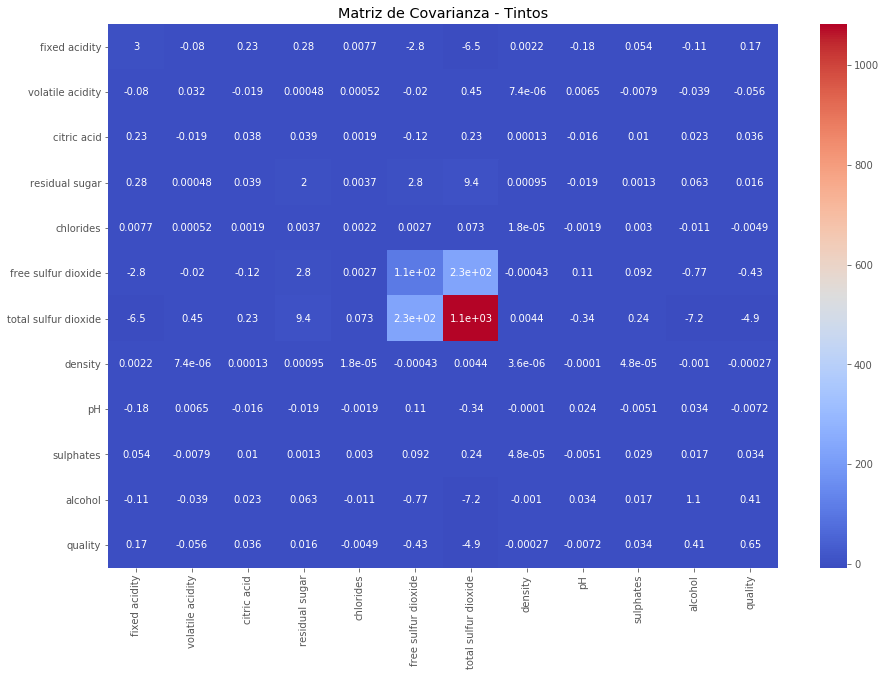

In [501]:
myMatrixHeatmap(covMat, "Matriz de Covarianza - Tintos")

### Covarianza Dataset Blancos

In [502]:
covMat = dsWine01W.cov()
covMat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,0.712114,-0.001931,0.029533,0.381022,0.000426,-0.708919,3.266013,0.000670,-0.054265,-0.001651,-0.125533,-0.084947
volatile acidity,-0.001931,0.010160,-0.001823,0.032865,0.000155,-0.166300,0.382354,0.000008,-0.000486,-0.000411,0.008400,-0.017382
citric acid,0.029533,-0.001823,0.014646,0.057829,0.000302,0.193630,0.622989,0.000054,-0.002992,0.000861,-0.011278,-0.000987
residual sugar,0.381022,0.032865,0.057829,25.725770,0.009828,25.800578,86.531303,0.012727,-0.148684,-0.015435,-2.812740,-0.438316
chlorides,0.000426,0.000155,0.000302,0.009828,0.000477,0.037674,0.184687,0.000017,-0.000298,0.000042,-0.009684,-0.004062
free sulfur dioxide,-0.708919,-0.166300,0.193630,25.800578,0.037674,289.242720,444.865891,0.014966,-0.001587,0.114938,-5.234509,0.122878
total sulfur dioxide,3.266013,0.382354,0.622989,86.531303,0.184687,444.865891,1806.085491,0.067352,0.014894,0.652645,-23.476605,-6.576746
density,0.000670,0.000008,0.000054,0.012727,0.000017,0.014966,0.067352,0.000009,-0.000042,0.000025,-0.002871,-0.000814
pH,-0.054265,-0.000486,-0.002992,-0.148684,-0.000298,-0.001587,0.014894,-0.000042,0.022801,0.002688,0.022565,0.013297
sulphates,-0.001651,-0.000411,0.000861,-0.015435,0.000042,0.114938,0.652645,0.000025,0.002688,0.013025,-0.002448,0.005425


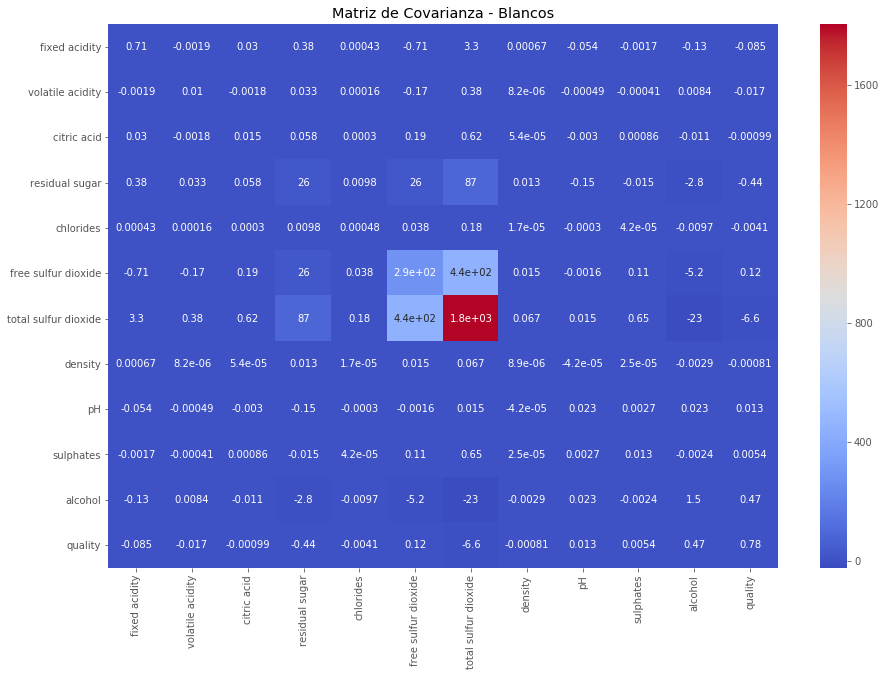

In [503]:
myMatrixHeatmap(covMat, "Matriz de Covarianza - Blancos")

##### El análisis de covarianza está afectado por la escala de los datos. 
Por tanto es necesario realizar el escalamiento de los datos. Sin embargo, primero deben eliminarse los outliers que se encontraron en los gráficos de líneas. 

## Outliers

### Remover Outliers al dataset completo
Se obtienen los zscores de las variables numéricas del dataset. Se aplica un filtro para eliminar los scores por encima de 1. Este filtro se aplica para generar un dataset nuevo sin outliers. 

In [504]:
z_scores = stats.zscore(dsWine01[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']])
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
dsWine01_no = dsWine01[filtered_entries]
dsWine01_no.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
count,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000
mean,7.094400,0.326473,0.312827,5.502355,0.051594,30.711017,118.006490,0.994501,3.218476,0.519333,10.508584,5.840073,0.212847,0.787153
std,1.049439,0.146075,0.133340,4.650097,0.021046,16.371290,54.383357,0.002864,0.154581,0.127270,1.196047,0.863842,0.409355,0.409355
min,3.900000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.740000,0.220000,8.000000,3.000000,0.000000,0.000000
25%,6.400000,0.220000,0.250000,1.800000,0.037000,18.000000,84.000000,0.992160,3.110000,0.430000,9.500000,5.000000,0.000000,1.000000
50%,6.900000,0.290000,0.310000,3.200000,0.046000,29.000000,120.000000,0.994700,3.210000,0.500000,10.300000,6.000000,0.000000,1.000000
75%,7.600000,0.390000,0.380000,8.200000,0.060000,42.000000,156.000000,0.996800,3.320000,0.590000,11.300000,6.000000,0.000000,1.000000
max,11.100000,0.830000,0.740000,19.500000,0.161000,83.000000,282.000000,1.002600,3.700000,0.970000,14.050000,9.000000,1.000000,1.000000


In [505]:
dsWine01.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.246114,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,0.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,0.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,0.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000,1.000000


La comparación de ambos datasets revela que se han eliminado 488 samples por outliers.

### Remover Outliers a Tintos

In [506]:
z_scoresR = stats.zscore(dsWine01R[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']])
abs_z_scoresR = np.abs(z_scoresR)
filtered_entriesR = (abs_z_scoresR < 3).all(axis=1)
dsWine01R_no = dsWine01R[filtered_entriesR]
dsWine01R_no.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000
mean,8.312551,0.524050,0.265281,2.388717,0.081531,15.089849,43.660494,0.996718,3.316152,0.642414,10.417798,5.646776
std,1.647635,0.169451,0.191271,0.865307,0.021218,9.317669,29.414615,0.001718,0.141052,0.129753,1.021649,0.801119
min,5.000000,0.120000,0.000000,1.200000,0.038000,1.000000,6.000000,0.991500,2.880000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,21.000000,0.995600,3.220000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,36.000000,0.996700,3.315000,0.620000,10.200000,6.000000
75%,9.200000,0.635000,0.420000,2.600000,0.089000,21.000000,58.000000,0.997800,3.400000,0.720000,11.100000,6.000000
max,13.500000,1.040000,0.790000,6.700000,0.226000,47.000000,145.000000,1.002200,3.750000,1.160000,13.600000,8.000000


In [507]:
dsWine01R.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Se removieron 141 samples en tintos. 

### Remover Outliers a Blancos

In [508]:
z_scoresW = stats.zscore(dsWine01W[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']])
abs_z_scoresW = np.abs(z_scoresW)
filtered_entriesW = (abs_z_scoresW < 3).all(axis=1)
dsWine01W_no = dsWine01W[filtered_entriesW]
dsWine01W_no.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000
mean,6.840749,0.271465,0.326513,6.414705,0.043153,34.821302,137.533319,0.993964,3.188256,0.485426,10.540115,5.912261
std,0.786885,0.086082,0.101038,4.954158,0.011724,15.427580,41.323011,0.002908,0.143456,0.105782,1.226173,0.869685
min,4.400000,0.080000,0.000000,0.600000,0.012000,2.000000,19.000000,0.987110,2.790000,0.220000,8.400000,3.000000
25%,6.300000,0.210000,0.270000,1.762500,0.035000,23.000000,108.000000,0.991663,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.310000,5.300000,0.042500,34.000000,133.000000,0.993700,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.380000,9.900000,0.050000,45.000000,166.000000,0.996100,3.280000,0.540000,11.400000,6.000000
max,9.300000,0.580000,0.690000,20.800000,0.110000,86.000000,260.000000,1.001960,3.640000,0.830000,14.200000,9.000000


In [473]:
dsWine01W.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


Se elimina 396 samples

### Comparación lineal de variables con principales outliers

#### Acidez Fija

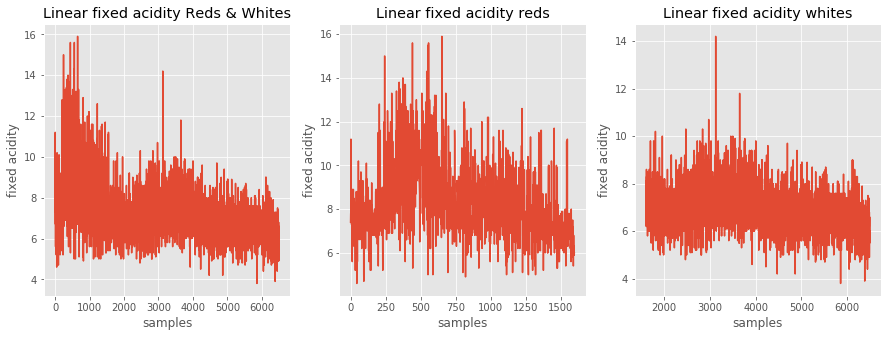

In [474]:
myLinearFeature('fixed acidity')

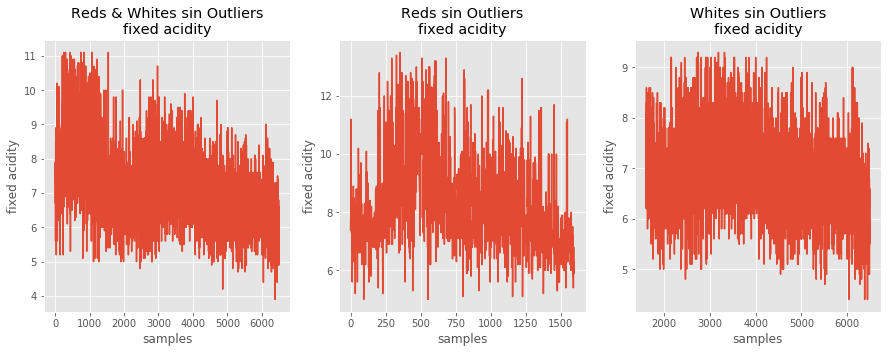

In [477]:
myLinearFeatureComp('Reds & Whites sin Outliers', dsWine01_no, 'fixed acidity', 
                    'Reds sin Outliers', dsWine01R_no, 'fixed acidity', 
                    'Whites sin Outliers', dsWine01W_no, 'fixed acidity')

#### Densidad

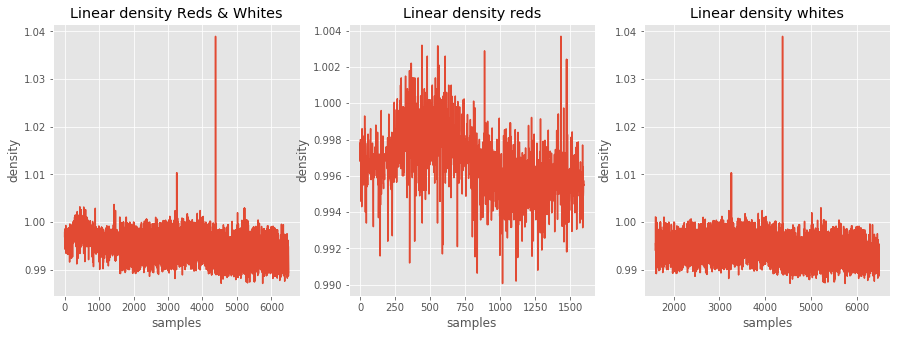

In [478]:
myLinearFeature('density')

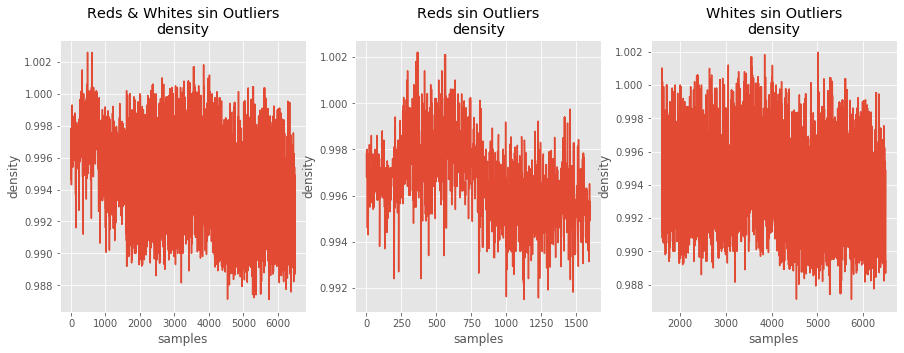

In [479]:
myLinearFeatureComp('Reds & Whites sin Outliers', dsWine01_no, 'density', 
                    'Reds sin Outliers', dsWine01R_no, 'density', 
                    'Whites sin Outliers', dsWine01W_no, 'density')

#### Conclusión
Remover los outliers hizo un recorte importante de samples. El set está más balanceado de esta manera y debería mejorar los resultados de predicción

## Escalamiento de variables
Para el escalado de las variables se utilizarán los datasets sin outliers

In [789]:
min_max_scaler = preprocessing.MinMaxScaler()
dsWine01_scaled = dsWine01_no.copy()
dsWine01_scaled = dsWine01_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']]
dsWine01_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']] = min_max_scaler.fit_transform(dsWine01_scaled)
dsWine01_scaled['quality'] = dsWine01_no['quality']
dsWine01_scaled['qualityf'] = dsWine01_no['qualityf']
dsWine01_scaled['type'] = dsWine01_no['type']
dsWine01_scaled['type_red'] = dsWine01_no['type_red']
dsWine01_scaled['type_white'] = dsWine01_no['type_white']

dsWine01R_scaled = dsWine01R_no.copy()
dsWine01R_scaled = dsWine01R_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']]
dsWine01R_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']] = min_max_scaler.fit_transform(dsWine01R_scaled)
dsWine01R_scaled['quality'] = dsWine01R_no['quality']
dsWine01R_scaled['qualityf'] = dsWine01R_no['qualityf']
dsWine01R_scaled['type'] = dsWine01R_no['type']

dsWine01W_scaled = dsWine01W_no.copy()
dsWine01W_scaled = dsWine01W_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']]
dsWine01W_scaled[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates', 'alcohol']] = min_max_scaler.fit_transform(dsWine01W_scaled)
dsWine01W_scaled['quality'] = dsWine01W_no['quality']
dsWine01W_scaled['qualityf'] = dsWine01W_no['qualityf']
dsWine01W_scaled['type'] = dsWine01W_no['type']

dsWine01_scaled.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type_red,type_white
count,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000,6009.000000
mean,0.443667,0.328630,0.422740,0.259384,0.280225,0.362329,0.405821,0.477122,0.498412,0.399110,0.414642,5.840073,0.212847,0.787153
std,0.145755,0.194767,0.180189,0.246037,0.138462,0.199650,0.197041,0.184896,0.161021,0.169693,0.197694,0.863842,0.409355,0.409355
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000
25%,0.347222,0.186667,0.337838,0.063492,0.184211,0.207317,0.282609,0.326017,0.385417,0.280000,0.247934,5.000000,0.000000,1.000000
50%,0.416667,0.280000,0.418919,0.137566,0.243421,0.341463,0.413043,0.489994,0.489583,0.373333,0.380165,6.000000,0.000000,1.000000
75%,0.513889,0.413333,0.513514,0.402116,0.335526,0.500000,0.543478,0.625565,0.604167,0.493333,0.545455,6.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,1.000000


In [790]:
dsWine01R_scaled.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000,1458.000000
mean,0.389712,0.439185,0.335799,0.216130,0.231547,0.306301,0.270939,0.487674,0.501324,0.376403,0.388038,5.646776
std,0.193839,0.184186,0.242116,0.157328,0.112863,0.202558,0.211616,0.160582,0.162129,0.156329,0.196471,0.801119
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.247059,0.293478,0.113924,0.127273,0.170213,0.130435,0.107914,0.383178,0.390805,0.265060,0.211538,5.000000
50%,0.341176,0.434783,0.316456,0.181818,0.218085,0.260870,0.215827,0.485981,0.500000,0.349398,0.346154,6.000000
75%,0.494118,0.559783,0.531646,0.254545,0.271277,0.434783,0.374101,0.588785,0.597701,0.469880,0.519231,6.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000


In [791]:
dsWine01W_scaled.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000,4502.000000
mean,0.498112,0.382930,0.473207,0.287857,0.317884,0.390730,0.491839,0.461553,0.468537,0.435125,0.368985,5.912261
std,0.160589,0.172164,0.146432,0.245255,0.119636,0.183662,0.171465,0.195808,0.168771,0.173413,0.211409,0.869685
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.387755,0.260000,0.391304,0.057550,0.234694,0.250000,0.369295,0.306566,0.352941,0.311475,0.189655,5.000000
50%,0.489796,0.360000,0.449275,0.232673,0.311224,0.380952,0.473029,0.443771,0.458824,0.409836,0.344828,6.000000
75%,0.591837,0.480000,0.550725,0.460396,0.387755,0.511905,0.609959,0.605387,0.576471,0.524590,0.517241,6.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000


## Correlación y Covarianza de dataset escalado
### Dataset completo (Tintos y Blancos)

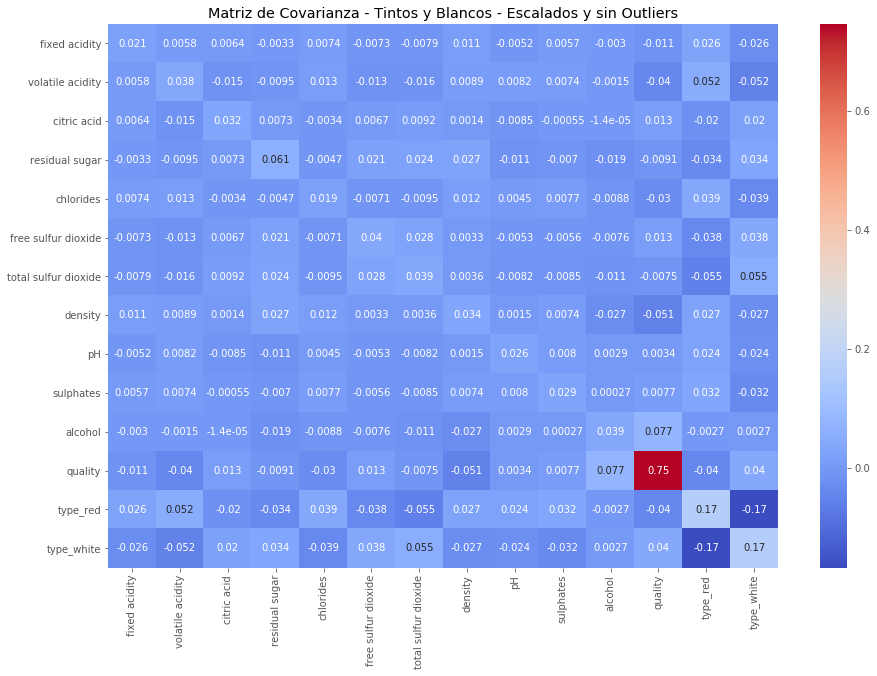

In [525]:
covMat = dsWine01_scaled.cov()
myMatrixHeatmap(covMat, "Matriz de Covarianza - Tintos y Blancos - Escalados y sin Outliers")

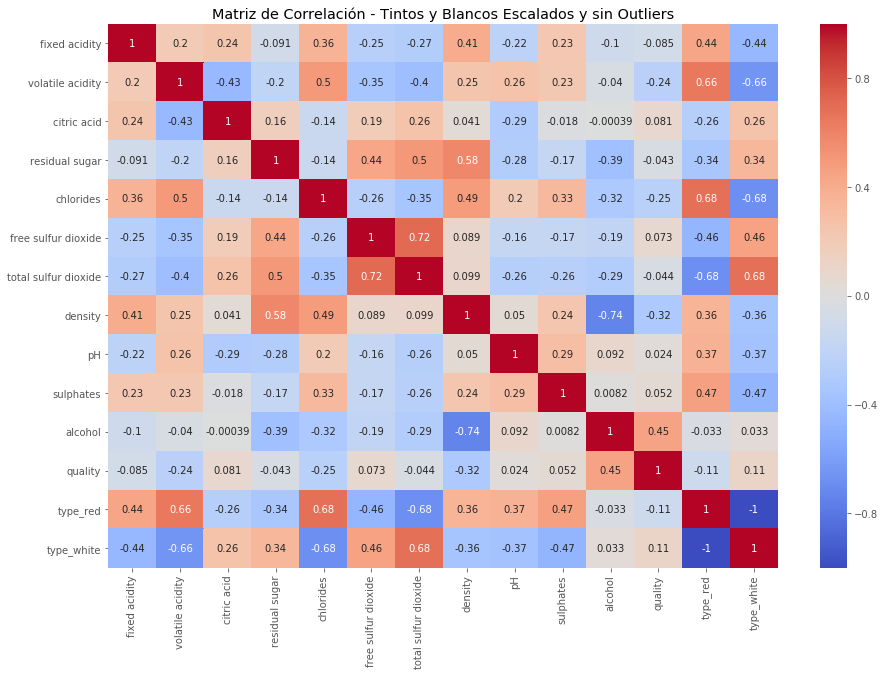

In [526]:
corrMat = dsWine01_scaled.corr()
myMatrixHeatmap(corrMat, "Matriz de Correlación - Tintos y Blancos Escalados y sin Outliers")

In [527]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nTintos y Blancos\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Tintos y Blancos


alcohol               density                 0.739946
density               alcohol                 0.739946
total sulfur dioxide  free sulfur dioxide     0.717954
free sulfur dioxide   total sulfur dioxide    0.717954
type_white            chlorides               0.684296
chlorides             type_white              0.684296
type_red              chlorides               0.684296
chlorides             type_red                0.684296
total sulfur dioxide  type_white              0.682317
type_red              total sulfur dioxide    0.682317
total sulfur dioxide  type_red                0.682317
type_white            total sulfur dioxide    0.682317
volatile acidity      type_red                0.655438
type_red              volatile acidity        0.655438
volatile acidity      type_white              0.655438
type_white            volatile acidity        0.655438
dtype: float64

### Solo Tintos

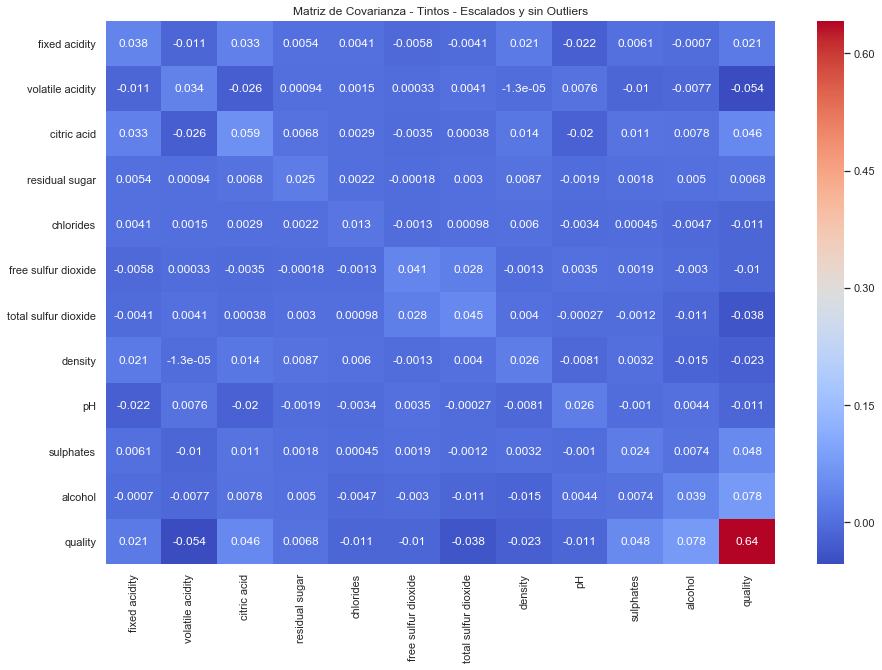

In [792]:
covMat = dsWine01R_scaled.cov()
myMatrixHeatmap(covMat, "Matriz de Covarianza - Tintos - Escalados y sin Outliers")

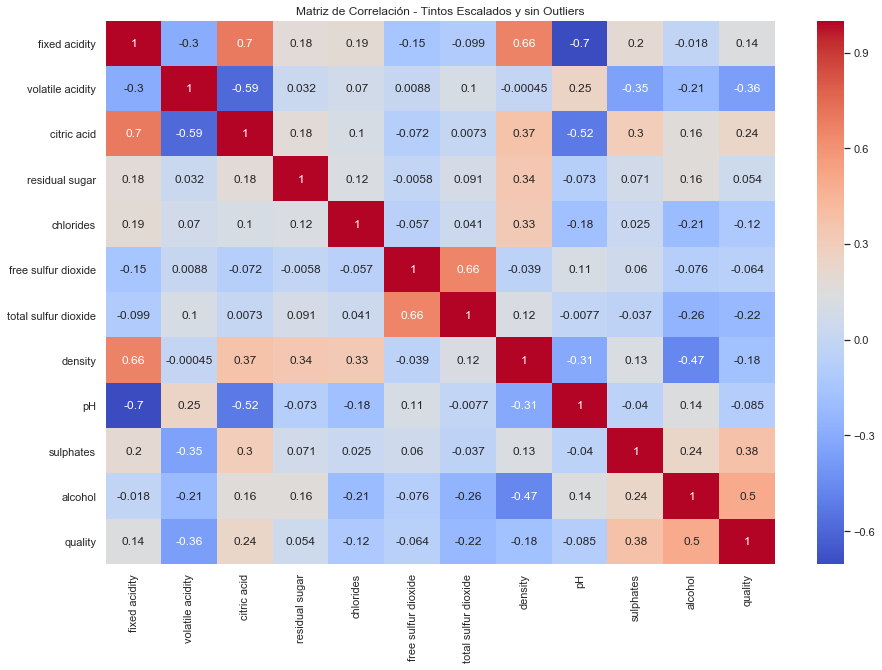

In [793]:
corrMat = dsWine01R_scaled.corr()
myMatrixHeatmap(corrMat, "Matriz de Correlación - Tintos Escalados y sin Outliers")

In [794]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nTintos\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Tintos


pH                    fixed acidity           0.704507
fixed acidity         pH                      0.704507
citric acid           fixed acidity           0.699747
fixed acidity         citric acid             0.699747
                      density                 0.660497
density               fixed acidity           0.660497
total sulfur dioxide  free sulfur dioxide     0.660348
free sulfur dioxide   total sulfur dioxide    0.660348
dtype: float64

### Solo Blancos

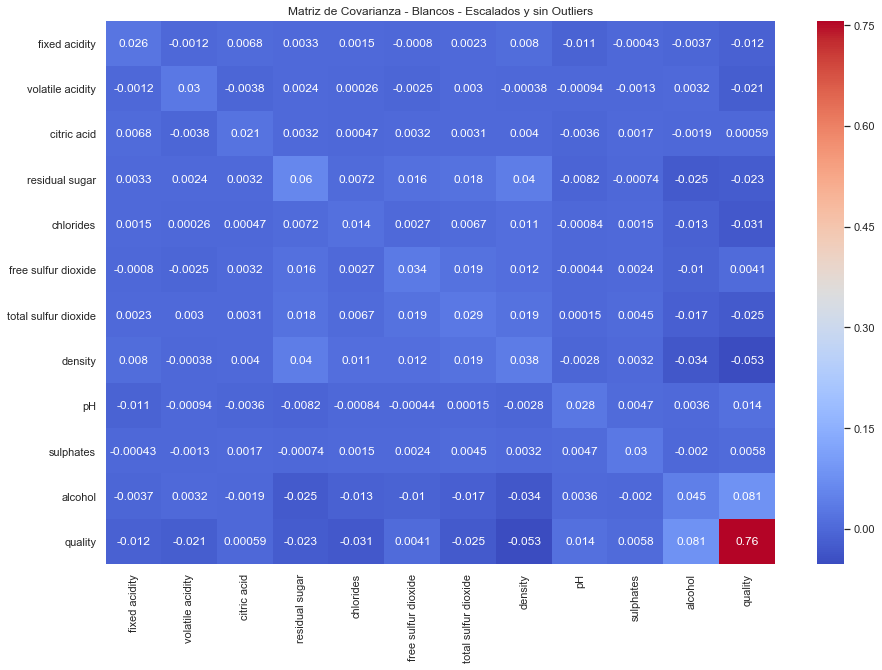

In [795]:
covMat = dsWine01W_scaled.cov()
myMatrixHeatmap(covMat, "Matriz de Covarianza - Blancos - Escalados y sin Outliers")

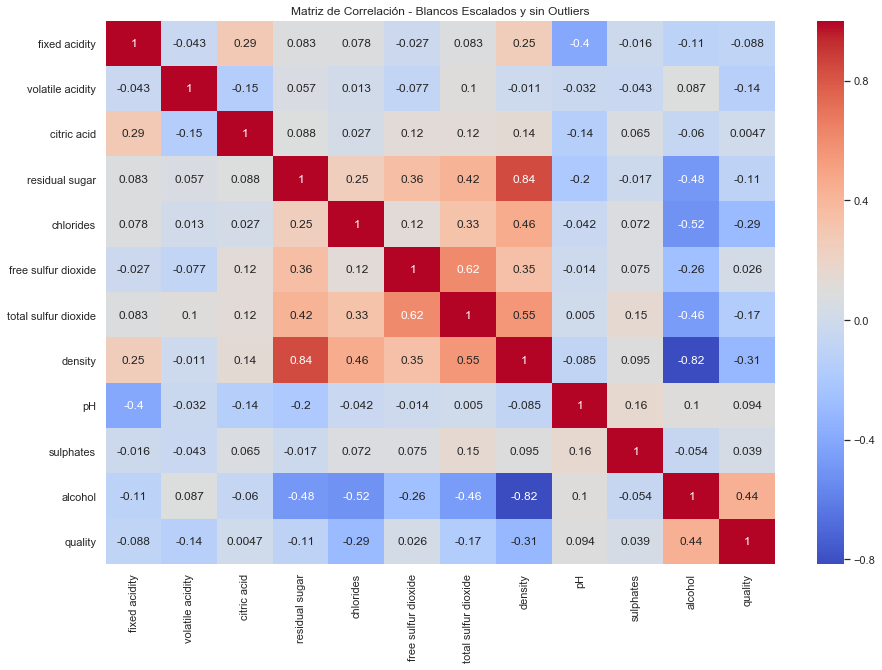

In [796]:
corrMat = dsWine01W_scaled.corr()
myMatrixHeatmap(corrMat, "Matriz de Correlación - Blancos Escalados y sin Outliers")

In [797]:
corrMat = corrMat.abs()
corrMat[corrMat == 1] = 0
corr_cols = corrMat.abs().unstack().sort_values(ascending=False)
print("Top Correlaciones > 0.65\nBlancos\n========================")
display(corr_cols[corr_cols > 0.65])

Top Correlaciones > 0.65
Blancos


density         residual sugar    0.840197
residual sugar  density           0.840197
density         alcohol           0.816193
alcohol         density           0.816193
dtype: float64

## Recodificación quality
La variable qualityf tiene 11 posibles valores según la descripción del dataset. Dado que la nota es dada según la experiencia sensorial del catador, la diferencia entre un valor y el consecutivo es muy subjetiva. Por tanto, es posible recodificar los valores para disminuir la cantidad de posibles opciones y ser más precisos en la predicción. 

La recodificación se hará así: 
- 10,9,8,7   equivale 3 Bueno
- 6,5    equivale 2 Regular
- 4,3,2,1,0    equivale 1 Deficiente


In [1088]:
def myRecodeQuality(ds):
    ds["qualityf_rc"] = ds["quality"]    
    ds.qualityf_rc.replace([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
                           [1, 1, 1, 1, 1, 2, 2, 3, 3, 3, 3],
                           inplace=True)
    ds["qualityf_rc"] = ds["qualityf_rc"].astype("category")
    ds["quality_rc"] = ds["qualityf_rc"].astype("int32")

## dataset completo
myRecodeQuality(dsWine01)

## dataset tintos only
myRecodeQuality(dsWine01R)

## dataset blancos only
myRecodeQuality(dsWine01W)

## dataset completo escalado
myRecodeQuality(dsWine01_scaled)

## dataset tintos escalado
myRecodeQuality(dsWine01R_scaled)

## dataset blancos escalado
myRecodeQuality(dsWine01W_scaled)


## Conclusiones EDA, Pre-processing y Feature Engineering
A este punto tenemos 3 set de datos correspondientes a Blancos, Tintos y Blancos y Tintos juntos. Cada dataset pasó por la detección y eliminación de outliers.  Además los datasets tienen la variable dependiente en tipo entero (quality) y categórica (qualityf). 

En cuanto al feature engineering, el dataset completo (Tintos y Blancos) tiene una dumificación de la variable type, en dos variables enteras: type_white y type_red. Se realizó escalamiento de valores después de la detección de outliers.

En cuanto a la correlación entre variables, después del escalamiento cambiaron las correlaciones. El dataset completo mantiene correlaciones fuertes superiores a 0.65. Pero los datasets de tintos y blancos por separado tienen relaciones fuertess superiores a 0.65. pero todas por debajo de 0.9

## Construcción de modelos - Clasificación
Este ejercicio no solo valorará los diferentes modelos, sino que evaluará los diferentes datasets creados. La idea es crear la mejor combinación de dataset y modelo

In [1089]:
## Crear un dataframe de set de datos para pasarlos por los modelos out of box
dfds_cols=["DatasetName", "Dataset"]
dfDataSets = pd.DataFrame([["dsWine01R_scaled", dsWine01R_scaled],
                          ["dsWine01W_scaled", dsWine01W_scaled]],
                          columns=dfds_cols)

dfDataSets

,DatasetName,Dataset
0,dsWine01R_scaled,fixed acidity volatile acidity citric ...
1,dsWine01W_scaled,fixed acidity volatile acidity citric ...


### Modelos out of the box para dataset completo

#### Importar Modelos a Utilizar

In [1090]:
rand_state = 124
clasificadores = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.01, probability=True, random_state = rand_state),
    RandomForestClassifier(random_state = rand_state),
    GradientBoostingClassifier(random_state = rand_state),
    MLPClassifier(random_state = rand_state)]

#### Log y evaluadores

In [1091]:
# En este dataframe se anotarán los resultados del fit de cada modelo en cada dataset.
log_cols=["Dataset","Classifier", "Accuracy", "Log Loss", "Kappa", "Confusion Matrix"]
log = pd.DataFrame(columns=log_cols)

#### Fit y evaluación

In [1092]:
for index, row in dfDataSets.iterrows():
    dfds = row["Dataset"]
    dfname = row["DatasetName"]
    print("Dataset: ", dfname)

    # Crear un dataset ideal para el modelo
    dsWine_otb = dfds.copy()
    dsWine_otb.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

    # tomo una muestra del dataset ready 
    X_train, X_test, y_train, y_test = train_test_split(dsWine_otb, dfds[["qualityf_rc"]], test_size=0.30, random_state=123)
    # revisar datos
    print("Filas dataset entrenamiento (X_train): ", len(X_train.index))
    print("Filas dataset test: (X_test)", len(X_test.index))
    print("Filas y_train: ", len(y_train.index))
    print("Filas y_test: ", len(y_test.index))

    for model in clasificadores:
        model.fit(X_train, y_train.values.ravel())
        name = model.__class__.__name__

        print("Modelo: ", name)

        train_predictions = model.predict(X_test)

        cm = confusion_matrix(y_test.values.ravel(),train_predictions)

        acc = accuracy_score(y_test.values.ravel(), train_predictions)
        #print("Accuracy: {:.4%}".format(acc))

        kap = cohen_kappa_score(y_test.values.ravel(), train_predictions)
        #print("Kappa: {:.4%}".format(kap))

        train_predictions = model.predict_proba(X_test)
        ll = log_loss(y_test.values.ravel(), train_predictions)
        #print("Log Loss: {}".format(ll))

        log_entry = pd.DataFrame([[dfname, name, acc*100, ll, kap*100, cm]], columns=log_cols)
        log = log.append(log_entry)

    print("="*30)


Dataset:  dsWine01R_scaled
Filas dataset entrenamiento (X_train):  1020
Filas dataset test: (X_test) 438
Filas y_train:  1020
Filas y_test:  438
Modelo:  KNeighborsClassifier
Modelo:  SVC
Modelo:  RandomForestClassifier
Modelo:  GradientBoostingClassifier


C:\Users\rramirez\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Modelo:  MLPClassifier
Dataset:  dsWine01W_scaled
Filas dataset entrenamiento (X_train):  3151
Filas dataset test: (X_test) 1351
Filas y_train:  3151
Filas y_test:  1351
Modelo:  KNeighborsClassifier
Modelo:  SVC
Modelo:  RandomForestClassifier
Modelo:  GradientBoostingClassifier
Modelo:  MLPClassifier


C:\Users\rramirez\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Se analizan los resultados, primero los de mejor accuracy y luego los de mejor Kappa

In [1093]:
log.sort_values(by=['Accuracy', 'Kappa'], ascending=False)

,Dataset,Classifier,Accuracy,Log Loss,Kappa,Confusion Matrix
0,dsWine01R_scaled,KNeighborsClassifier,86.301370,2.678778,49.375867,"[[0, 18, 0], [4, 340, 11], [0, 27, 38]]"
0,dsWine01R_scaled,RandomForestClassifier,85.159817,1.675248,40.746753,"[[1, 17, 0], [1, 344, 10], [0, 37, 28]]"
0,dsWine01R_scaled,GradientBoostingClassifier,84.474886,0.448985,41.977714,"[[1, 17, 0], [3, 337, 15], [0, 33, 32]]"
0,dsWine01R_scaled,MLPClassifier,84.018265,0.431737,34.882338,"[[0, 18, 0], [0, 343, 12], [0, 40, 25]]"
0,dsWine01W_scaled,RandomForestClassifier,82.235381,1.053917,50.423838,"[[6, 33, 0], [4, 929, 56], [1, 146, 176]]"
0,dsWine01R_scaled,SVC,81.050228,0.451052,0.000000,"[[0, 18, 0], [0, 355, 0], [0, 65, 0]]"
0,dsWine01W_scaled,GradientBoostingClassifier,79.718727,0.493313,42.488488,"[[5, 33, 1], [7, 920, 62], [0, 171, 152]]"
0,dsWine01W_scaled,KNeighborsClassifier,78.978534,2.725067,44.840495,"[[2, 35, 2], [13, 880, 96], [4, 134, 185]]"
0,dsWine01W_scaled,MLPClassifier,76.609919,0.508832,33.389087,"[[0, 39, 0], [0, 898, 91], [0, 186, 137]]"
0,dsWine01W_scaled,SVC,73.205033,0.579317,0.000000,"[[0, 39, 0], [0, 989, 0], [0, 323, 0]]"


##### Conclusión: 
El set de datos de Tintos, tanto escalado como normal tiene un mejor accuracy y kappa. Para tintos escalados el mejor modelo es KNeighborsClassifier y el segundo es RandomForestClassifier.

En el caso de los Blancos, el set de datos normal y escalado tienen un rendimiento similar con el algoritmo RandomForestClassifier.

### Gradient Boosting Tuning para Tintos

#### Log y Evaluadores

In [1094]:
# En este dataframe se anotarán los resultados del fit de los modelos optimizados.
log_cols=["Dataset","Classifier", "Accuracy", "Kappa", "Confusion Matrix"]
logfinal = pd.DataFrame(columns=log_cols)

#### Repetir out of the box - Tintos

In [1095]:
# Crear un dataset ideal para el modelo
dsWine_Final = dsWine01R_scaled.copy()
dsWine_Final.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

# tomo una muestra del dataset ready 
X_train, X_test, y_train, y_test = train_test_split(dsWine_Final, dsWine01R_scaled[["qualityf_rc"]], test_size=0.30, random_state=123)

rand_state = 124
modelGBCR_otb = GradientBoostingClassifier(random_state = rand_state)
modelGBCR_otb.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelGBCR_otb.predict(X_test)
acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "GBCR_otb", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 84.4749% Kappa: 41.9777%
              precision    recall  f1-score   support

           1       0.25      0.06      0.09        18
           2       0.87      0.95      0.91       355
           3       0.68      0.49      0.57        65

    accuracy                           0.84       438
   macro avg       0.60      0.50      0.52       438
weighted avg       0.82      0.84      0.82       438



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

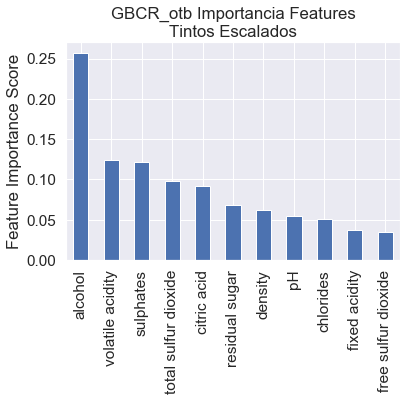

In [1100]:
feat_imp = pd.Series(modelGBCR_otb.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='GBCR_otb Importancia Features\nTintos Escalados')
plt.ylabel('Feature Importance Score')

#### Tuning
Se intentará mejorar el modelo con los siguientes parámetros: learning rate, n_estimators, max_depth, min_samples_split y min_samples_leaf

In [1101]:
p_test = {'learning_rate':[0.1,0.05,0.01], 'n_estimators':[100,500,1000,1500]}

tuning = GridSearchCV(estimator =GradientBoostingClassifier(random_state = rand_state), 
                      param_grid = p_test, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
                                                  presort=

In [1102]:
tuning.best_params_, tuning.best_score_

({'learning_rate': 0.01, 'n_estimators': 500}, 0.8626739681476877)

Ha mejorado Accuracy a 86.3% con un learning_rate = 0.01 y n_estimartors = 500

#### Tunning Max_depth

In [1103]:
p_test2 = {'max_depth':[2,3,4,5,8,10,16,20] }
tuning = GridSearchCV(estimator =GradientBoostingClassifier(random_state = rand_state, 
                                                            learning_rate=0.01,
                                                            n_estimators=500), 
                      param_grid = p_test2, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.01,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=500,
                                                  n_iter_no_change=None,
                                                  presort

In [1104]:
tuning.best_params_, tuning.best_score_

({'max_depth': 4}, 0.8685948165674036)

Max_depth mejoró más el resultado anterior a 86.9%. Max_depth = 4

In [1105]:
p_test3 = {'min_samples_split':[2,4,6,8,10,20,40,60,100], 'min_samples_leaf':[1,3,5,7,9]}
tuning = GridSearchCV(estimator =GradientBoostingClassifier(random_state = rand_state, 
                                                            learning_rate=0.01,
                                                            n_estimators=500,
                                                            max_depth=4), 
                      param_grid = p_test3, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.01,
                                                  loss='deviance', max_depth=4,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=500,
                                                  n_iter_no_change=None,
                                                  presort

In [1106]:
tuning.best_params_, tuning.best_score_

({'min_samples_leaf': 1, 'min_samples_split': 2}, 0.8685948165674036)

min_samples_split y min_samples_leaf no mejoró más el resultado anterior 86.9%. min_samples_split = 1 y min_samples_leaf = 2

#### GB Tuneado - Tintos

In [1107]:
rand_state = 124
modelGBCR_tun = GradientBoostingClassifier(random_state = rand_state,
                                          learning_rate=0.01,
                                          max_depth=4,
                                          n_estimators=500,
                                          min_samples_leaf=1,
                                          min_samples_split=2)
modelGBCR_tun.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelGBCR_tun.predict(X_test)

acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "GBCR_tun", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 83.7900% Kappa: 37.5981%
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        18
           2       0.86      0.95      0.90       355
           3       0.67      0.45      0.54        65

    accuracy                           0.84       438
   macro avg       0.51      0.47      0.48       438
weighted avg       0.80      0.84      0.81       438



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

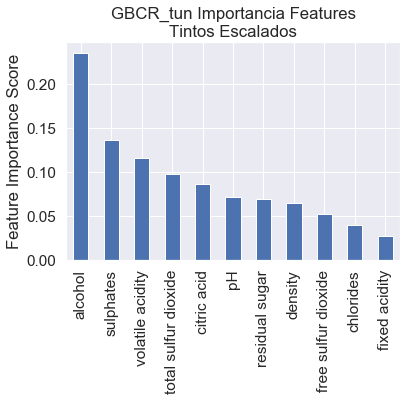

In [1108]:
feat_imp = pd.Series(modelGBCR_tun.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='GBCR_tun Importancia Features\nTintos Escalados')
plt.ylabel('Feature Importance Score')

##### Conclusion
A pesar de utilizar los parámetros obtenidos del tunning, el Accuracy con los datos de test no mejora.

### Random Forest Tuning para Tintos

#### Repetir out of the box - Tintos

In [1109]:
# Crear un dataset ideal para el modelo
dsWine_Final = dsWine01R_scaled.copy()
dsWine_Final.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

# tomo una muestra del dataset ready 
X_train, X_test, y_train, y_test = train_test_split(dsWine_Final, dsWine01R_scaled[["qualityf_rc"]], test_size=0.30, random_state=123)

rand_state = 124
modelRFCR_otb = RandomForestClassifier(random_state = rand_state)
modelRFCR_otb.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelRFCR_otb.predict(X_test)
acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "RFCR_otb", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 85.1598% Kappa: 40.7468%
              precision    recall  f1-score   support

           1       0.50      0.06      0.10        18
           2       0.86      0.97      0.91       355
           3       0.74      0.43      0.54        65

    accuracy                           0.85       438
   macro avg       0.70      0.49      0.52       438
weighted avg       0.83      0.85      0.83       438



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

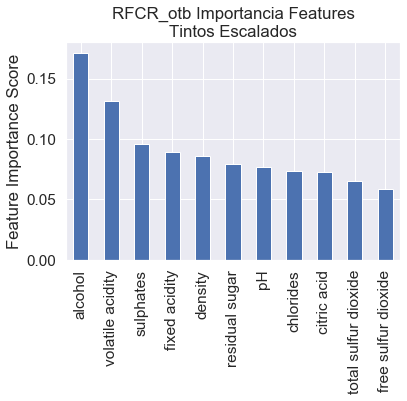

In [1110]:
feat_imp = pd.Series(modelRFCR_otb.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='RFCR_otb Importancia Features\nTintos Escalados')
plt.ylabel('Feature Importance Score')

#### Tuning
Se intentará mejorar el modelo con los siguientes parámetros: max_features & max_depth

In [1111]:
# son 11 columnas, max_features ideal value debería ser sqrt(columnas). Este valor es 3 o 4. Veremos cuál queda mejor
p_test = {'max_features':[3,4,5,7,9,11], 'max_depth':[2,3,4,5,6,7]}
tuning = GridSearchCV(estimator =RandomForestClassifier(random_state = rand_state), 
                      param_grid = p_test, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=124,
                                              verbose=0, warm_start=False),
             iid=False, n_jobs=4,
             param_grid={'max

In [1112]:
tuning.best_params_, tuning.best_score_

({'max_depth': 6, 'max_features': 7}, 0.8626931455541709)

Con estos nuevos parámetros, Accuracy mejoró a 86.3%

#### RF Tuneado - Tintos

In [1113]:
rand_state = 124
modelRFCR_tun = RandomForestClassifier(random_state = rand_state,
                                          max_depth=6,
                                          max_features=7)
modelRFCR_tun.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelRFCR_tun.predict(X_test)

acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "RFCR_tun", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 84.0183% Kappa: 35.9274%
              precision    recall  f1-score   support

           1       0.25      0.06      0.09        18
           2       0.86      0.96      0.91       355
           3       0.71      0.38      0.50        65

    accuracy                           0.84       438
   macro avg       0.61      0.47      0.50       438
weighted avg       0.81      0.84      0.81       438



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

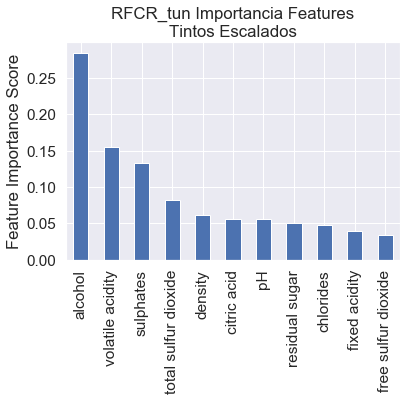

In [1114]:
feat_imp = pd.Series(modelRFCR_tun.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='RFCR_tun Importancia Features\nTintos Escalados')
plt.ylabel('Feature Importance Score')

### KNeighbors Tuning para Tintos

#### Repetir out of the box - Tintos

In [1115]:
# Crear un dataset ideal para el modelo
dsWine_Final = dsWine01R_scaled.copy()
dsWine_Final.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

# tomo una muestra del dataset ready 
X_train, X_test, y_train, y_test = train_test_split(dsWine_Final, dsWine01R_scaled[["qualityf_rc"]], test_size=0.30, random_state=123)

rand_state = 124
modelKNCR_otb = KNeighborsClassifier(3)
modelKNCR_otb.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelKNCR_otb.predict(X_test)
acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "KNCR_otb", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 86.3014% Kappa: 49.3759%
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        18
           2       0.88      0.96      0.92       355
           3       0.78      0.58      0.67        65

    accuracy                           0.86       438
   macro avg       0.55      0.51      0.53       438
weighted avg       0.83      0.86      0.84       438



#### Tuning
Se intentará mejorar el modelo con los siguientes parámetros: n_Neighbors y weights

In [1116]:
p_test = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], 'weights':['uniform', 'distance']}
tuning = GridSearchCV(estimator =KNeighborsClassifier(), 
                      param_grid = p_test, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid=False, n_jobs=4,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [1117]:
tuning.best_params_, tuning.best_score_

({'n_neighbors': 22, 'weights': 'distance'}, 0.8734685035714989)

Con estos nuevos parámetros, Accuracy mejoró a 87.3%

#### KN Tuneado - Tintos

In [1118]:
rand_state = 124
modelKNCR_tun = KNeighborsClassifier(n_neighbors=22,
                                    weights='distance')
modelKNCR_tun.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelKNCR_tun.predict(X_test)

acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01R_scaled", "KNCR_tun", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 84.9315% Kappa: 37.0525%
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        18
           2       0.86      0.98      0.91       355
           3       0.76      0.38      0.51        65

    accuracy                           0.85       438
   macro avg       0.54      0.45      0.47       438
weighted avg       0.81      0.85      0.82       438



C:\Users\rramirez\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Random Forest Tuning para Blancos

#### Repetir out of the box - Blancos

In [1119]:
# Crear un dataset ideal para el modelo
dsWine_Final = dsWine01W_scaled.copy()
dsWine_Final.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

# tomo una muestra del dataset ready 
X_train, X_test, y_train, y_test = train_test_split(dsWine_Final, dsWine01W_scaled[["qualityf_rc"]], test_size=0.30, random_state=123)

rand_state = 124
modelRFCW_otb = RandomForestClassifier(random_state = rand_state)
modelRFCW_otb.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelRFCW_otb.predict(X_test)
acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01W_scaled", "RFCW_otb", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 82.2354% Kappa: 50.4238%
              precision    recall  f1-score   support

           1       0.55      0.15      0.24        39
           2       0.84      0.94      0.89       989
           3       0.76      0.54      0.63       323

    accuracy                           0.82      1351
   macro avg       0.71      0.55      0.59      1351
weighted avg       0.81      0.82      0.81      1351



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

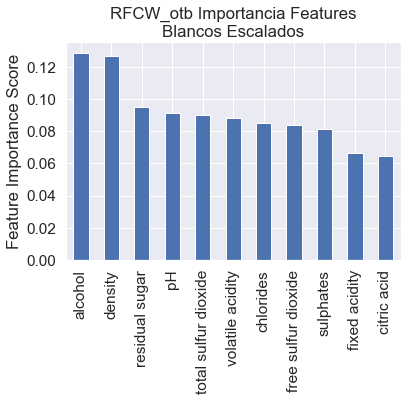

In [1120]:
feat_imp = pd.Series(modelRFCW_otb.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='RFCW_otb Importancia Features\nBlancos Escalados')
plt.ylabel('Feature Importance Score')

#### Tuning
Se intentará mejorar el modelo con los siguientes parámetros: max_features & max_depth

In [1121]:
# son 11 columnas, max_features ideal value debería ser sqrt(columnas). Este valor es 3 o 4. Veremos cuál queda mejor
#p_test = {'max_features':[3,4,5,7,9,11], 'max_depth':[2,3,4,5,6,9,10,11,14,15,20]}
p_test = {'n_estimators': [1, 2, 4, 8, 16, 32, 64, 100, 200]}
tuning = GridSearchCV(estimator =RandomForestClassifier(random_state = rand_state), 
                      param_grid = p_test, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=124,
                                              verbose=0, warm_start=False),
             iid=False, n_jobs=4,
             param_grid={'n_e

In [1122]:
tuning.best_params_, tuning.best_score_

({'n_estimators': 100}, 0.8400560344067383)

In [1123]:
p_test2 = {'max_depth': [4,5,6,9,10,11,14,15,20,24,32]}
tuning = GridSearchCV(estimator =RandomForestClassifier(random_state = rand_state, n_estimators = 100), 
                      param_grid = p_test2, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=5)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=124,
                                              verbose=0, warm_start=False),
             iid=False, n_jobs=4,
             param_grid={'max_de

In [1124]:
tuning.best_params_, tuning.best_score_

({'max_depth': 15}, 0.8432225830752913)

#### RF Tuneado - Blancos

In [1125]:
rand_state = 124
modelRFCW_tun = RandomForestClassifier(random_state = rand_state,
                                          max_depth=15,
                                          n_estimators=100)
modelRFCW_tun.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelRFCW_tun.predict(X_test)

acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01W_scaled", "RFCW_tun", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 83.8638% Kappa: 53.9371%
              precision    recall  f1-score   support

           1       1.00      0.10      0.19        39
           2       0.84      0.96      0.90       989
           3       0.82      0.56      0.66       323

    accuracy                           0.84      1351
   macro avg       0.89      0.54      0.58      1351
weighted avg       0.84      0.84      0.82      1351



##### Importancia de Variables

Text(0, 0.5, 'Feature Importance Score')

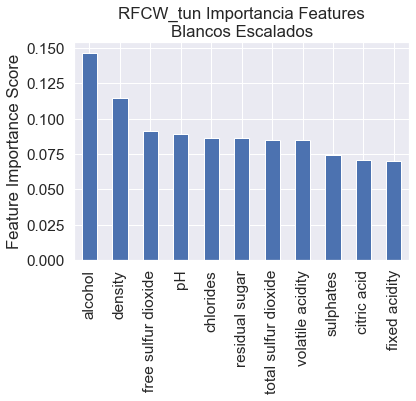

In [1126]:
feat_imp = pd.Series(modelRFCW_tun.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='RFCW_tun Importancia Features\nBlancos Escalados')
plt.ylabel('Feature Importance Score')

### KNeighbors Tuning para Blancos

#### Repetir out of the box - Blancos

In [1127]:
# Crear un dataset ideal para el modelo
dsWine_Final = dsWine01W_scaled.copy()
dsWine_Final.drop(['type','quality','qualityf','qualityf_rc','quality_rc'], axis=1, inplace=True)

# tomo una muestra del dataset ready 
X_train, X_test, y_train, y_test = train_test_split(dsWine_Final, dsWine01W_scaled[["qualityf_rc"]], test_size=0.30, random_state=123)

rand_state = 124
modelKNCR_otb = KNeighborsClassifier(3)
modelKNCR_otb.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelKNCR_otb.predict(X_test)
acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01W_scaled", "KNCW_otb", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 78.9785% Kappa: 44.8405%
              precision    recall  f1-score   support

           1       0.11      0.05      0.07        39
           2       0.84      0.89      0.86       989
           3       0.65      0.57      0.61       323

    accuracy                           0.79      1351
   macro avg       0.53      0.50      0.51      1351
weighted avg       0.77      0.79      0.78      1351



#### Tuning
Se intentará mejorar el modelo con los siguientes parámetros: n_Neighbors y weights

In [1128]:
p_test = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], 'weights':['uniform', 'distance']}
tuning = GridSearchCV(estimator =KNeighborsClassifier(), 
                      param_grid = p_test, 
                      scoring='accuracy',
                      n_jobs=4,
                      iid=False, 
                      cv=10)
tuning.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid=False, n_jobs=4,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [1129]:
tuning.best_params_, tuning.best_score_

({'n_neighbors': 15, 'weights': 'distance'}, 0.8384548218931688)

Con estos nuevos parámetros, Accuracy mejoró a 83.8%

#### KN Tuneado - Tintos

In [1130]:
rand_state = 124
modelKNCW_tun = KNeighborsClassifier(n_neighbors=15,
                                    weights='distance')
modelKNCW_tun.fit(X_train,y_train.values.ravel())
predictors=list(X_train)

pred=modelKNCW_tun.predict(X_test)

acc = accuracy_score(y_test.values.ravel(), pred)
    
kap = cohen_kappa_score(y_test.values.ravel(), pred)
print("Accuracy: {:.4%}".format(acc), "Kappa: {:.4%}".format(kap))

cm = confusion_matrix(y_test.values.ravel(),pred)

print(classification_report(y_test.values.ravel(), pred))

log_entry = pd.DataFrame([["dsWine01W_scaled", "KNCW_tun", acc*100, kap*100, cm]], columns=log_cols)
logfinal = logfinal.append(log_entry)

Accuracy: 83.6417% Kappa: 55.1967%
              precision    recall  f1-score   support

           1       1.00      0.08      0.14        39
           2       0.85      0.94      0.89       989
           3       0.76      0.62      0.68       323

    accuracy                           0.84      1351
   macro avg       0.87      0.54      0.57      1351
weighted avg       0.84      0.84      0.82      1351



## Resultados con Modelos Tuned

### Tintos

In [1131]:
# generar un conjunto de datos separado para los tintos
logR_tuned = logfinal.loc[logfinal['Classifier'].isin(['GBCR_tun','RFCR_tun','KNCR_tun','RFCW_tun','KNCW_tun']) & 
                        logfinal['Dataset'].isin(['dsWine01R_scaled']) ]
logR_tuned.reset_index(inplace = True) 
logR_tuned

,index,Dataset,Classifier,Accuracy,Kappa,Confusion Matrix
0,0,dsWine01R_scaled,GBCR_tun,83.789954,37.598074,"[[0, 18, 0], [3, 338, 14], [0, 36, 29]]"
1,0,dsWine01R_scaled,RFCR_tun,84.018265,35.927443,"[[1, 17, 0], [3, 342, 10], [0, 40, 25]]"
2,0,dsWine01R_scaled,KNCR_tun,84.931507,37.052522,"[[0, 18, 0], [0, 347, 8], [0, 40, 25]]"


#### Accuracy y Kappa

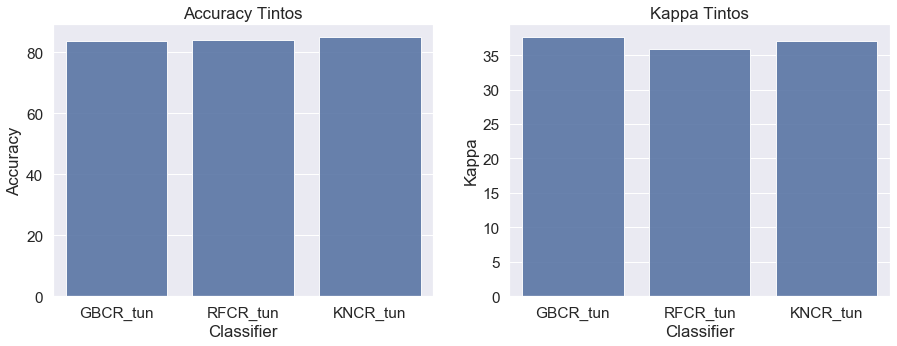

In [1132]:
fig, axs = plt.subplots(1, 2, sharey=False, tight_layout=False, figsize=(15, 5))
axs[0].set_title('Accuracy Tintos')
axs[1].set_title('Kappa Tintos')

sns.barplot(y='Accuracy', x='Classifier', data=logR_tuned, color="b", alpha=0.9, ax = axs[0])
sns.barplot(y='Kappa', x='Classifier', data=logR_tuned, color="b", alpha=0.9, ax = axs[1])



La mejor relación Accuracy y Kappa lo da el modelo K-neighbors

#### Matrices de confusión

In [1157]:
## esta función se utilizará para graficar matrices de confusión
def myCM(matrix, title):
    labels = ['1-Deficiente', '2-Regular', '3-Bueno']
    sns.set(font_scale=1.4) # for label size
    annot_kws = {"ha": 'left',"va": 'center', "color":'r'}
    fig, ax = plt.subplots(figsize=(7,5))       
    sns.heatmap(matrix, annot=True, annot_kws=annot_kws, fmt="d", ax=ax, cmap="YlGnBu")
    #ax.set_yticklabels(ax.get_yticklabels(), rotation = 0)
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)
    plt.xlabel('Predicted', fontsize = 15) # x-axis label with fontsize 15
    plt.ylabel('Ground Truth', fontsize = 15) # y-axis label with fontsize 15
    b, t = plt.ylim() # discover the values for bottom and top
    b += 0.5 # Add 0.5 to the bottom
    t -= 0.5 # Subtract 0.5 from the top
    plt.ylim(b, t) # update the ylim(bottom, top) values
    plt.title(title)
    plt.show() # ta-da!

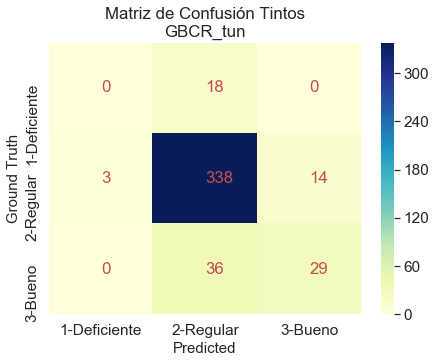

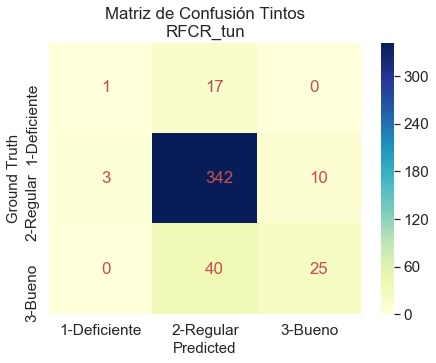

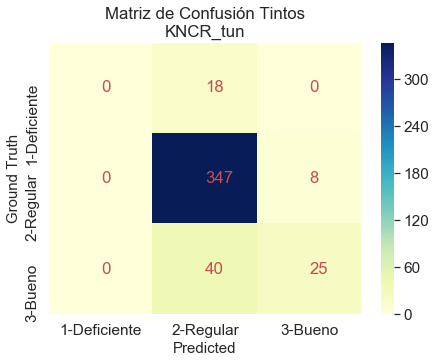

In [1158]:
for i in range(3):
    myCM(logR_tuned.loc[i,"Confusion Matrix"], 'Matriz de Confusión Tintos\n' + logR_tuned.loc[i,"Classifier"])


### Blancos

In [1135]:
# generar un conjunto de datos separado para los tintos
logW_tuned = logfinal.loc[logfinal['Classifier'].isin(['GBCR_tun','RFCR_tun','KNCR_tun','RFCW_tun','KNCW_tun']) & 
                        logfinal['Dataset'].isin(['dsWine01W_scaled']) ]
logW_tuned.reset_index(inplace = True) 
logW_tuned

,index,Dataset,Classifier,Accuracy,Kappa,Confusion Matrix
0,0,dsWine01W_scaled,RFCW_tun,83.863805,53.937083,"[[4, 35, 0], [0, 949, 40], [0, 143, 180]]"
1,0,dsWine01W_scaled,KNCW_tun,83.641747,55.196697,"[[3, 36, 0], [0, 927, 62], [0, 123, 200]]"


#### Accuracy y Kappa

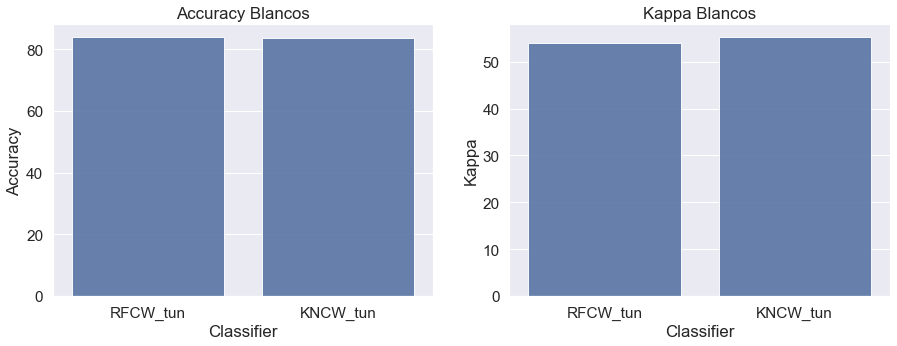

In [1136]:
fig, axs = plt.subplots(1, 2, sharey=False, tight_layout=False, figsize=(15, 5))
axs[0].set_title('Accuracy Blancos')
axs[1].set_title('Kappa Blancos')

sns.barplot(y='Accuracy', x='Classifier', data=logW_tuned, color="b", alpha=0.9, ax = axs[0])
sns.barplot(y='Kappa', x='Classifier', data=logW_tuned, color="b", alpha=0.9, ax = axs[1])


La mejor relación Accuracy y Kappa lo da el modelo K-neighbors

#### Matrices de confusión

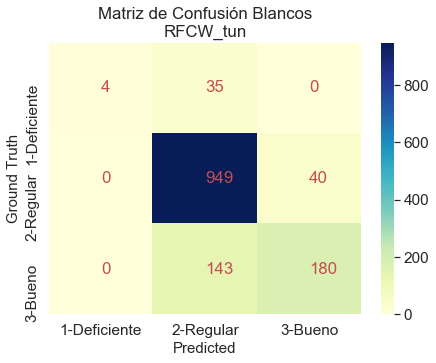

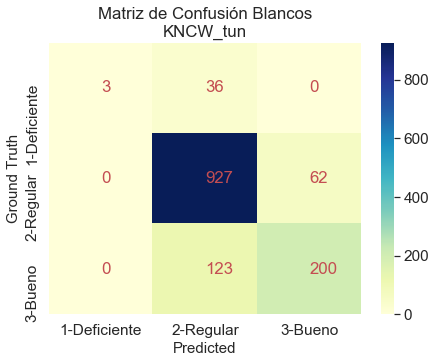

In [1159]:
for i in range(2):
    myCM(logW_tuned.loc[i,"Confusion Matrix"], 'Matriz de Confusión Blancos\n' + logW_tuned.loc[i,"Classifier"])


### Conclusión
La revisión de los scores de Accuracy y Kappa concluyen que el mejor algoritmo de clasificación en ambos casos es K-neighbors. Sin embargo, los valores Kappa son apenas aceptables en las predicciones de vino blanco, y poco fiables en el vino tinto. 

La principal sugerencia en este caso es intentar resolver este problema de predicción con algoritmos de regresión lineal. Este ejercicio se desarrollará en los próximos días (espero).